In [1]:
# from __future__ import print_function, division
import torch
import torch
import torch.nn as nn
import torch.optim as optim
import datanewn as dt
import model_4_o as md
import copy
from pytorch_ssim import ssim
from torch.utils.data import DataLoader, ConcatDataset
import model_ResUGAN as GAN
import torch.nn.functional as F
from torch.autograd import Variable
import numpy as np
import os
import matplotlib.pyplot as plt
from torchvision import transforms, utils
from pytorch_msssim import msssim

In [2]:
# print gpu
torch.cuda.set_device(1)
currentDevice = torch.cuda.current_device()
print("Current GPU: " + str(currentDevice))
print(str(torch.cuda.device_count()))
print(str(torch.cuda.get_device_capability(currentDevice)))
print(torch.__version__)
USE_GPU = 1
if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda:1')
else:
    device = "cpu"
print(device)

Current GPU: 1
8
(6, 1)
1.0.0
cuda:1


In [9]:
# generate csv file, run only for the first time
import csvgenerator as csvg
# csvg.generate_csv(True)
# batchsize 32->16
csvFilePath = csvg.get_csv_path(True)
print(csvFilePath)
transformed_dataset = dt.HE_SHG_Dataset(csv_file=csvFilePath,
                                               transform=dt.Compose([                                              
                                               dt.Rescale(96),                                     
                                               dt.Normalize(),
                                               dt.ToTensor()
                                           ]))
# TODO: change the normalization parameters
dataloader = DataLoader(transformed_dataset, batch_size=840,
                        shuffle=True, num_workers=0)
print(len(transformed_dataset))

/deepdata/adib/HEtoSHG/cs766/Data/screened/image_files.csv
323905


In [4]:
# load model
import os
cwd = os.getcwd();
path = os.path.join(cwd, 'Best model', 'ournetwork.pth')
model = md.Net()
gpu_ids = [1, 2, 3, 4, 5, 6]
torch.cuda.set_device(gpu_ids[0])
model = torch.nn.DataParallel(model, device_ids=gpu_ids)
model.load_state_dict(torch.load(path))
model.eval()
model = model.cuda()

In [5]:
cwd = os.getcwd();
save_path = os.path.join(cwd, 'Best model','ournetwork.pth')

In [6]:
# configure loss functions
criterionL = nn.L1Loss()
criterionL = criterionL.cuda()
criterionMSE = nn.MSELoss()
criterionMSE = criterionMSE.cuda()
def train(epoch, p, windowsize):
    epoch_loss = 0
    for iteration, batch in enumerate(dataloader):
        input, target = batch['input'].to(device), batch['output'].to(device)

        optimizer.zero_grad()
        output = model(input)
        targetf = target.float()
        targetf = targetf[:, None]
        
        lossMSE = criterionL(output, targetf)      
        lossSSIM = 1-ssim(output, targetf, window_size=windowsize)
        
        # 0.75->0.4 after 3 epochs
        loss = p*lossMSE + (1-p)*lossSSIM
        combineLoss = p*lossMSE.item() + (1-p)*lossSSIM.item()
        
        epoch_loss = epoch_loss + combineLoss
        loss.backward()
        optimizer.step()
    
        if iteration%50 == 0:
            print("lossL1: " + str(lossMSE.item()) +
                  " " + "lossSSIM: " + str(lossSSIM.item()))
            print("===> Epoch[{}]({}/{}): Loss: {:.4f}".format(epoch, iteration, len(dataloader), loss.item()))

    print("===> Epoch {} Complete: Avg. Loss: {:.4f}".format(epoch, epoch_loss / len(dataloader)))
    torch.save(model.state_dict(), Save_generator_path)

In [7]:
# plot 32 output images
def test():
    avg_psnr = 0
    with torch.no_grad():
        for iteration, batch in enumerate(dataloader):
            input, target = batch['input'].to(device), batch['output'].to(device)
                
            prediction = model(input)

            target = target.float()

            outdataloader = {'input':prediction,'output':target}
            
            print(outdataloader['input'].size(), 
                      outdataloader['output'].size())

            plt.figure()
            input_batch, label_batch = outdataloader['input'], outdataloader['output']
            
            input = input[0:32, :, :, :]
            input_batch = input_batch[0:32, :, :, :]
            label_batch = label_batch[0:32, :, :]
            
            batch_size = 32
            im_size = input_batch.size(2)
            label_batch=label_batch.reshape([batch_size,1,im_size,im_size])
            print(label_batch.size())
                          
            grid = utils.make_grid(input).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))
            plt.figure()
    
            grid = utils.make_grid(input_batch).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))
            plt.figure()

            grid = utils.make_grid(label_batch).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))
            
            plt.axis('off')
            plt.ioff()
            plt.show()
            if iteration == 16:
                break

In [ ]:
# generate intermediate images
def generateimage():
    avg_psnr = 0
    with torch.no_grad():
        for iteration, batch in enumerate(dataloader):
            input, target = batch['input'].to(device), batch['output'].to(device)
                
            prediction = model(input)

            target = target.float()
            # save input, target, prediction


In [8]:
p = 0
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, betas=(0.5, 0.999))
# generator.apply(md.weights_init_normal)
# discriminator.apply(md.weights_init_normal)
Save_generator_path=os.path.join(save_path)

windowsize = 11
for epoch in range(1, 200 + 1):
        
    train(epoch, p, windowsize)

lossL1: 0.053754884749650955 lossSSIM: 0.4270055890083313
===> Epoch[1](0/1196): Loss: 0.4270
lossL1: 0.05248448997735977 lossSSIM: 0.43253153562545776
===> Epoch[1](50/1196): Loss: 0.4325
lossL1: 0.05413557589054108 lossSSIM: 0.4233323931694031
===> Epoch[1](100/1196): Loss: 0.4233
lossL1: 0.05087605491280556 lossSSIM: 0.40888679027557373
===> Epoch[1](150/1196): Loss: 0.4089
lossL1: 0.056607864797115326 lossSSIM: 0.43580567836761475
===> Epoch[1](200/1196): Loss: 0.4358
lossL1: 0.053436025977134705 lossSSIM: 0.4251363277435303
===> Epoch[1](250/1196): Loss: 0.4251
lossL1: 0.05340702086687088 lossSSIM: 0.41088443994522095
===> Epoch[1](300/1196): Loss: 0.4109
lossL1: 0.052870627492666245 lossSSIM: 0.4233367443084717
===> Epoch[1](350/1196): Loss: 0.4233
lossL1: 0.05165087804198265 lossSSIM: 0.420485258102417
===> Epoch[1](400/1196): Loss: 0.4205
lossL1: 0.05537369102239609 lossSSIM: 0.4283066391944885
===> Epoch[1](450/1196): Loss: 0.4283
lossL1: 0.054514914751052856 lossSSIM: 0.42310

lossL1: 0.05710364505648613 lossSSIM: 0.43366509675979614
===> Epoch[4](650/1196): Loss: 0.4337
lossL1: 0.05286535993218422 lossSSIM: 0.4147302508354187
===> Epoch[4](700/1196): Loss: 0.4147
lossL1: 0.05478871241211891 lossSSIM: 0.426774263381958
===> Epoch[4](750/1196): Loss: 0.4268
lossL1: 0.05140431597828865 lossSSIM: 0.4175974130630493
===> Epoch[4](800/1196): Loss: 0.4176
lossL1: 0.05259455367922783 lossSSIM: 0.40903258323669434
===> Epoch[4](850/1196): Loss: 0.4090
lossL1: 0.052947916090488434 lossSSIM: 0.41571271419525146
===> Epoch[4](900/1196): Loss: 0.4157
lossL1: 0.0540601946413517 lossSSIM: 0.4212658405303955
===> Epoch[4](950/1196): Loss: 0.4213
lossL1: 0.051692742854356766 lossSSIM: 0.40620750188827515
===> Epoch[4](1000/1196): Loss: 0.4062
lossL1: 0.05619151517748833 lossSSIM: 0.4305570125579834
===> Epoch[4](1050/1196): Loss: 0.4306
lossL1: 0.05436817556619644 lossSSIM: 0.430341899394989
===> Epoch[4](1100/1196): Loss: 0.4303
lossL1: 0.055286064743995667 lossSSIM: 0.431

lossL1: 0.05425451323390007 lossSSIM: 0.42798399925231934
===> Epoch[8](100/1196): Loss: 0.4280
lossL1: 0.054835520684719086 lossSSIM: 0.42247670888900757
===> Epoch[8](150/1196): Loss: 0.4225
lossL1: 0.05349382385611534 lossSSIM: 0.41899412870407104
===> Epoch[8](200/1196): Loss: 0.4190
lossL1: 0.0568753182888031 lossSSIM: 0.43811166286468506
===> Epoch[8](250/1196): Loss: 0.4381
lossL1: 0.05090915784239769 lossSSIM: 0.4101340174674988
===> Epoch[8](300/1196): Loss: 0.4101
lossL1: 0.05333377793431282 lossSSIM: 0.4288344979286194
===> Epoch[8](350/1196): Loss: 0.4288
lossL1: 0.055044010281562805 lossSSIM: 0.418415367603302
===> Epoch[8](400/1196): Loss: 0.4184
lossL1: 0.05428450182080269 lossSSIM: 0.43110960721969604
===> Epoch[8](450/1196): Loss: 0.4311
lossL1: 0.053437165915966034 lossSSIM: 0.42590802907943726
===> Epoch[8](500/1196): Loss: 0.4259
lossL1: 0.05341038107872009 lossSSIM: 0.4166686534881592
===> Epoch[8](550/1196): Loss: 0.4167
lossL1: 0.0509224534034729 lossSSIM: 0.4044

lossL1: 0.05186253786087036 lossSSIM: 0.42324525117874146
===> Epoch[11](750/1196): Loss: 0.4232
lossL1: 0.054207198321819305 lossSSIM: 0.4233655333518982
===> Epoch[11](800/1196): Loss: 0.4234
lossL1: 0.05414046719670296 lossSSIM: 0.41540318727493286
===> Epoch[11](850/1196): Loss: 0.4154
lossL1: 0.053682729601860046 lossSSIM: 0.41227543354034424
===> Epoch[11](900/1196): Loss: 0.4123
lossL1: 0.05419940501451492 lossSSIM: 0.424966037273407
===> Epoch[11](950/1196): Loss: 0.4250
lossL1: 0.052283015102148056 lossSSIM: 0.41681092977523804
===> Epoch[11](1000/1196): Loss: 0.4168
lossL1: 0.052993353456258774 lossSSIM: 0.4112417697906494
===> Epoch[11](1050/1196): Loss: 0.4112
lossL1: 0.05232756957411766 lossSSIM: 0.4236317276954651
===> Epoch[11](1100/1196): Loss: 0.4236
lossL1: 0.05251608416438103 lossSSIM: 0.41653889417648315
===> Epoch[11](1150/1196): Loss: 0.4165
===> Epoch 11 Complete: Avg. Loss: 0.4216
lossL1: 0.054580092430114746 lossSSIM: 0.43479716777801514
===> Epoch[12](0/1196):

lossL1: 0.051052894443273544 lossSSIM: 0.40532386302948
===> Epoch[15](150/1196): Loss: 0.4053
lossL1: 0.05363078415393829 lossSSIM: 0.4181932210922241
===> Epoch[15](200/1196): Loss: 0.4182
lossL1: 0.05076383054256439 lossSSIM: 0.4164476990699768
===> Epoch[15](250/1196): Loss: 0.4164
lossL1: 0.053744010627269745 lossSSIM: 0.41532057523727417
===> Epoch[15](300/1196): Loss: 0.4153
lossL1: 0.0524076446890831 lossSSIM: 0.4174097180366516
===> Epoch[15](350/1196): Loss: 0.4174
lossL1: 0.054277677088975906 lossSSIM: 0.4226580858230591
===> Epoch[15](400/1196): Loss: 0.4227
lossL1: 0.05040498822927475 lossSSIM: 0.409579336643219
===> Epoch[15](450/1196): Loss: 0.4096
lossL1: 0.049795523285865784 lossSSIM: 0.4047755002975464
===> Epoch[15](500/1196): Loss: 0.4048
lossL1: 0.05324423313140869 lossSSIM: 0.41983920335769653
===> Epoch[15](550/1196): Loss: 0.4198
lossL1: 0.05752918869256973 lossSSIM: 0.4390355348587036
===> Epoch[15](600/1196): Loss: 0.4390
lossL1: 0.05332387238740921 lossSSIM: 

lossL1: 0.055289074778556824 lossSSIM: 0.42040735483169556
===> Epoch[18](750/1196): Loss: 0.4204
lossL1: 0.0546133816242218 lossSSIM: 0.42434149980545044
===> Epoch[18](800/1196): Loss: 0.4243
lossL1: 0.054009076207876205 lossSSIM: 0.4316142201423645
===> Epoch[18](850/1196): Loss: 0.4316
lossL1: 0.053870897740125656 lossSSIM: 0.42576777935028076
===> Epoch[18](900/1196): Loss: 0.4258
lossL1: 0.05387606471776962 lossSSIM: 0.42279303073883057
===> Epoch[18](950/1196): Loss: 0.4228
lossL1: 0.05487519130110741 lossSSIM: 0.42829352617263794
===> Epoch[18](1000/1196): Loss: 0.4283
lossL1: 0.052166715264320374 lossSSIM: 0.4169231653213501
===> Epoch[18](1050/1196): Loss: 0.4169
lossL1: 0.05194461718201637 lossSSIM: 0.41292840242385864
===> Epoch[18](1100/1196): Loss: 0.4129
lossL1: 0.0560327023267746 lossSSIM: 0.4233367443084717
===> Epoch[18](1150/1196): Loss: 0.4233
===> Epoch 18 Complete: Avg. Loss: 0.4210
lossL1: 0.053169649094343185 lossSSIM: 0.4211045503616333
===> Epoch[19](0/1196): 

lossL1: 0.05607200786471367 lossSSIM: 0.4223242402076721
===> Epoch[22](150/1196): Loss: 0.4223
lossL1: 0.053391024470329285 lossSSIM: 0.41176408529281616
===> Epoch[22](200/1196): Loss: 0.4118
lossL1: 0.05192362517118454 lossSSIM: 0.4172877073287964
===> Epoch[22](250/1196): Loss: 0.4173
lossL1: 0.05099188908934593 lossSSIM: 0.4088732600212097
===> Epoch[22](300/1196): Loss: 0.4089
lossL1: 0.051664501428604126 lossSSIM: 0.40954911708831787
===> Epoch[22](350/1196): Loss: 0.4095
lossL1: 0.050320059061050415 lossSSIM: 0.4103275537490845
===> Epoch[22](400/1196): Loss: 0.4103
lossL1: 0.05540342256426811 lossSSIM: 0.4275549650192261
===> Epoch[22](450/1196): Loss: 0.4276
lossL1: 0.05420813336968422 lossSSIM: 0.42706936597824097
===> Epoch[22](500/1196): Loss: 0.4271
lossL1: 0.051548779010772705 lossSSIM: 0.4079350233078003
===> Epoch[22](550/1196): Loss: 0.4079
lossL1: 0.05347539857029915 lossSSIM: 0.4142568111419678
===> Epoch[22](600/1196): Loss: 0.4143
lossL1: 0.054663434624671936 loss

lossL1: 0.054668668657541275 lossSSIM: 0.4198421239852905
===> Epoch[25](750/1196): Loss: 0.4198
lossL1: 0.05439966544508934 lossSSIM: 0.42368167638778687
===> Epoch[25](800/1196): Loss: 0.4237
lossL1: 0.05388369411230087 lossSSIM: 0.42619431018829346
===> Epoch[25](850/1196): Loss: 0.4262
lossL1: 0.05300451070070267 lossSSIM: 0.4247751832008362
===> Epoch[25](900/1196): Loss: 0.4248
lossL1: 0.05466250702738762 lossSSIM: 0.42281895875930786
===> Epoch[25](950/1196): Loss: 0.4228
lossL1: 0.05443364381790161 lossSSIM: 0.4268650412559509
===> Epoch[25](1000/1196): Loss: 0.4269
lossL1: 0.054134901612997055 lossSSIM: 0.4110908508300781
===> Epoch[25](1050/1196): Loss: 0.4111
lossL1: 0.052551448345184326 lossSSIM: 0.4177452325820923
===> Epoch[25](1100/1196): Loss: 0.4177
lossL1: 0.054594606161117554 lossSSIM: 0.43412989377975464
===> Epoch[25](1150/1196): Loss: 0.4341
===> Epoch 25 Complete: Avg. Loss: 0.4205
lossL1: 0.05264756456017494 lossSSIM: 0.4101332426071167
===> Epoch[26](0/1196): L

lossL1: 0.05618217587471008 lossSSIM: 0.4239993691444397
===> Epoch[29](150/1196): Loss: 0.4240
lossL1: 0.05418316647410393 lossSSIM: 0.41530489921569824
===> Epoch[29](200/1196): Loss: 0.4153
lossL1: 0.053364481776952744 lossSSIM: 0.42760807275772095
===> Epoch[29](250/1196): Loss: 0.4276
lossL1: 0.05186452344059944 lossSSIM: 0.4099218249320984
===> Epoch[29](300/1196): Loss: 0.4099
lossL1: 0.054349035024642944 lossSSIM: 0.42041611671447754
===> Epoch[29](350/1196): Loss: 0.4204
lossL1: 0.05250212550163269 lossSSIM: 0.42606186866760254
===> Epoch[29](400/1196): Loss: 0.4261
lossL1: 0.052990302443504333 lossSSIM: 0.42027056217193604
===> Epoch[29](450/1196): Loss: 0.4203
lossL1: 0.05330444127321243 lossSSIM: 0.4277409315109253
===> Epoch[29](500/1196): Loss: 0.4277
lossL1: 0.05424024164676666 lossSSIM: 0.4237075448036194
===> Epoch[29](550/1196): Loss: 0.4237
lossL1: 0.05360805615782738 lossSSIM: 0.42141544818878174
===> Epoch[29](600/1196): Loss: 0.4214
lossL1: 0.05351577326655388 los

lossL1: 0.053102925419807434 lossSSIM: 0.42155271768569946
===> Epoch[32](750/1196): Loss: 0.4216
lossL1: 0.053650617599487305 lossSSIM: 0.42518192529678345
===> Epoch[32](800/1196): Loss: 0.4252
lossL1: 0.05528775230050087 lossSSIM: 0.4269310235977173
===> Epoch[32](850/1196): Loss: 0.4269
lossL1: 0.05503374710679054 lossSSIM: 0.42446351051330566
===> Epoch[32](900/1196): Loss: 0.4245
lossL1: 0.05378396064043045 lossSSIM: 0.42722511291503906
===> Epoch[32](950/1196): Loss: 0.4272
lossL1: 0.05398675426840782 lossSSIM: 0.4337959885597229
===> Epoch[32](1000/1196): Loss: 0.4338
lossL1: 0.05254518240690231 lossSSIM: 0.4185178875923157
===> Epoch[32](1050/1196): Loss: 0.4185
lossL1: 0.053187295794487 lossSSIM: 0.4130605459213257
===> Epoch[32](1100/1196): Loss: 0.4131
lossL1: 0.0537613183259964 lossSSIM: 0.41886264085769653
===> Epoch[32](1150/1196): Loss: 0.4189
===> Epoch 32 Complete: Avg. Loss: 0.4200
lossL1: 0.052967511117458344 lossSSIM: 0.4145646095275879
===> Epoch[33](0/1196): Loss

lossL1: 0.05518001690506935 lossSSIM: 0.4315303564071655
===> Epoch[36](150/1196): Loss: 0.4315
lossL1: 0.052882660180330276 lossSSIM: 0.4189821481704712
===> Epoch[36](200/1196): Loss: 0.4190
lossL1: 0.05152780935168266 lossSSIM: 0.4111638069152832
===> Epoch[36](250/1196): Loss: 0.4112
lossL1: 0.05305323377251625 lossSSIM: 0.4071080684661865
===> Epoch[36](300/1196): Loss: 0.4071
lossL1: 0.05446154624223709 lossSSIM: 0.41780346632003784
===> Epoch[36](350/1196): Loss: 0.4178
lossL1: 0.05378192663192749 lossSSIM: 0.42373931407928467
===> Epoch[36](400/1196): Loss: 0.4237
lossL1: 0.0537957027554512 lossSSIM: 0.42625701427459717
===> Epoch[36](450/1196): Loss: 0.4263
lossL1: 0.051710017025470734 lossSSIM: 0.42204374074935913
===> Epoch[36](500/1196): Loss: 0.4220
lossL1: 0.05377155914902687 lossSSIM: 0.4194927215576172
===> Epoch[36](550/1196): Loss: 0.4195
lossL1: 0.050919171422719955 lossSSIM: 0.4090331792831421
===> Epoch[36](600/1196): Loss: 0.4090
lossL1: 0.05130564048886299 lossSS

lossL1: 0.05390768125653267 lossSSIM: 0.41906821727752686
===> Epoch[39](750/1196): Loss: 0.4191
lossL1: 0.05283896625041962 lossSSIM: 0.4134563207626343
===> Epoch[39](800/1196): Loss: 0.4135
lossL1: 0.05232636258006096 lossSSIM: 0.4208247661590576
===> Epoch[39](850/1196): Loss: 0.4208
lossL1: 0.055963072925806046 lossSSIM: 0.4300053119659424
===> Epoch[39](900/1196): Loss: 0.4300
lossL1: 0.05379330739378929 lossSSIM: 0.4197204113006592
===> Epoch[39](950/1196): Loss: 0.4197
lossL1: 0.05457163229584694 lossSSIM: 0.419771671295166
===> Epoch[39](1000/1196): Loss: 0.4198
lossL1: 0.05566059798002243 lossSSIM: 0.43549585342407227
===> Epoch[39](1050/1196): Loss: 0.4355
lossL1: 0.05509257689118385 lossSSIM: 0.4325461983680725
===> Epoch[39](1100/1196): Loss: 0.4325
lossL1: 0.05411803722381592 lossSSIM: 0.4181478023529053
===> Epoch[39](1150/1196): Loss: 0.4181
===> Epoch 39 Complete: Avg. Loss: 0.4196
lossL1: 0.05344916880130768 lossSSIM: 0.418184757232666
===> Epoch[40](0/1196): Loss: 0.

lossL1: 0.05242089554667473 lossSSIM: 0.4226483106613159
===> Epoch[43](150/1196): Loss: 0.4226
lossL1: 0.05314512178301811 lossSSIM: 0.41187435388565063
===> Epoch[43](200/1196): Loss: 0.4119
lossL1: 0.05703210085630417 lossSSIM: 0.4280650019645691
===> Epoch[43](250/1196): Loss: 0.4281
lossL1: 0.05230994150042534 lossSSIM: 0.422166109085083
===> Epoch[43](300/1196): Loss: 0.4222
lossL1: 0.053708046674728394 lossSSIM: 0.42015713453292847
===> Epoch[43](350/1196): Loss: 0.4202
lossL1: 0.053811267018318176 lossSSIM: 0.4213786721229553
===> Epoch[43](400/1196): Loss: 0.4214
lossL1: 0.05184699967503548 lossSSIM: 0.40953755378723145
===> Epoch[43](450/1196): Loss: 0.4095
lossL1: 0.05572836846113205 lossSSIM: 0.42242711782455444
===> Epoch[43](500/1196): Loss: 0.4224
lossL1: 0.05655939131975174 lossSSIM: 0.42898809909820557
===> Epoch[43](550/1196): Loss: 0.4290
lossL1: 0.04912995919585228 lossSSIM: 0.39638209342956543
===> Epoch[43](600/1196): Loss: 0.3964
lossL1: 0.05270836129784584 lossS

lossL1: 0.05333757400512695 lossSSIM: 0.41754209995269775
===> Epoch[46](750/1196): Loss: 0.4175
lossL1: 0.05182778462767601 lossSSIM: 0.4187888503074646
===> Epoch[46](800/1196): Loss: 0.4188
lossL1: 0.05352098122239113 lossSSIM: 0.4123572111129761
===> Epoch[46](850/1196): Loss: 0.4124
lossL1: 0.05353104695677757 lossSSIM: 0.4201551675796509
===> Epoch[46](900/1196): Loss: 0.4202
lossL1: 0.05151670426130295 lossSSIM: 0.4173794388771057
===> Epoch[46](950/1196): Loss: 0.4174
lossL1: 0.05175095796585083 lossSSIM: 0.40723544359207153
===> Epoch[46](1000/1196): Loss: 0.4072
lossL1: 0.052742477506399155 lossSSIM: 0.413161039352417
===> Epoch[46](1050/1196): Loss: 0.4132
lossL1: 0.052753008902072906 lossSSIM: 0.41715800762176514
===> Epoch[46](1100/1196): Loss: 0.4172
lossL1: 0.052694883197546005 lossSSIM: 0.41638273000717163
===> Epoch[46](1150/1196): Loss: 0.4164
===> Epoch 46 Complete: Avg. Loss: 0.4193
lossL1: 0.05469047278165817 lossSSIM: 0.42467767000198364
===> Epoch[47](0/1196): Lo

lossL1: 0.05336878076195717 lossSSIM: 0.41723382472991943
===> Epoch[50](150/1196): Loss: 0.4172
lossL1: 0.055009808391332626 lossSSIM: 0.4134015440940857
===> Epoch[50](200/1196): Loss: 0.4134
lossL1: 0.05535462498664856 lossSSIM: 0.4230944514274597
===> Epoch[50](250/1196): Loss: 0.4231
lossL1: 0.05586814507842064 lossSSIM: 0.4309343695640564
===> Epoch[50](300/1196): Loss: 0.4309
lossL1: 0.05337361991405487 lossSSIM: 0.4110826253890991
===> Epoch[50](350/1196): Loss: 0.4111
lossL1: 0.052540890872478485 lossSSIM: 0.4182242751121521
===> Epoch[50](400/1196): Loss: 0.4182
lossL1: 0.05578527972102165 lossSSIM: 0.4275021553039551
===> Epoch[50](450/1196): Loss: 0.4275
lossL1: 0.05386439338326454 lossSSIM: 0.4172350764274597
===> Epoch[50](500/1196): Loss: 0.4172
lossL1: 0.053288139402866364 lossSSIM: 0.4127121567726135
===> Epoch[50](550/1196): Loss: 0.4127
lossL1: 0.05421600863337517 lossSSIM: 0.4212666153907776
===> Epoch[50](600/1196): Loss: 0.4213
lossL1: 0.0538586787879467 lossSSIM:

lossL1: 0.05578269809484482 lossSSIM: 0.4367949366569519
===> Epoch[53](750/1196): Loss: 0.4368
lossL1: 0.053129035979509354 lossSSIM: 0.42367029190063477
===> Epoch[53](800/1196): Loss: 0.4237
lossL1: 0.054420895874500275 lossSSIM: 0.4231245517730713
===> Epoch[53](850/1196): Loss: 0.4231
lossL1: 0.055030010640621185 lossSSIM: 0.4278811812400818
===> Epoch[53](900/1196): Loss: 0.4279
lossL1: 0.05218130350112915 lossSSIM: 0.4129897356033325
===> Epoch[53](950/1196): Loss: 0.4130
lossL1: 0.051414892077445984 lossSSIM: 0.40761512517929077
===> Epoch[53](1000/1196): Loss: 0.4076
lossL1: 0.05003064498305321 lossSSIM: 0.39769667387008667
===> Epoch[53](1050/1196): Loss: 0.3977
lossL1: 0.050178978592157364 lossSSIM: 0.40695446729660034
===> Epoch[53](1100/1196): Loss: 0.4070
lossL1: 0.055188316851854324 lossSSIM: 0.42477959394454956
===> Epoch[53](1150/1196): Loss: 0.4248
===> Epoch 53 Complete: Avg. Loss: 0.4189
lossL1: 0.053657166659832 lossSSIM: 0.4173768162727356
===> Epoch[54](0/1196): 

lossL1: 0.05148494988679886 lossSSIM: 0.41070622205734253
===> Epoch[57](150/1196): Loss: 0.4107
lossL1: 0.05562466382980347 lossSSIM: 0.42603862285614014
===> Epoch[57](200/1196): Loss: 0.4260
lossL1: 0.053025323897600174 lossSSIM: 0.41613489389419556
===> Epoch[57](250/1196): Loss: 0.4161
lossL1: 0.05119916796684265 lossSSIM: 0.4062662124633789
===> Epoch[57](300/1196): Loss: 0.4063
lossL1: 0.05634545907378197 lossSSIM: 0.43382126092910767
===> Epoch[57](350/1196): Loss: 0.4338
lossL1: 0.055763475596904755 lossSSIM: 0.4248732924461365
===> Epoch[57](400/1196): Loss: 0.4249
lossL1: 0.051053736358881 lossSSIM: 0.41087770462036133
===> Epoch[57](450/1196): Loss: 0.4109
lossL1: 0.05432460084557533 lossSSIM: 0.42189115285873413
===> Epoch[57](500/1196): Loss: 0.4219
lossL1: 0.05622205138206482 lossSSIM: 0.42742568254470825
===> Epoch[57](550/1196): Loss: 0.4274
lossL1: 0.054857559502124786 lossSSIM: 0.42171555757522583
===> Epoch[57](600/1196): Loss: 0.4217
lossL1: 0.05048227682709694 los

lossL1: 0.05567936971783638 lossSSIM: 0.4244602918624878
===> Epoch[60](750/1196): Loss: 0.4245
lossL1: 0.056711845099925995 lossSSIM: 0.43879926204681396
===> Epoch[60](800/1196): Loss: 0.4388
lossL1: 0.05362218618392944 lossSSIM: 0.4176051616668701
===> Epoch[60](850/1196): Loss: 0.4176
lossL1: 0.053916964679956436 lossSSIM: 0.412564754486084
===> Epoch[60](900/1196): Loss: 0.4126
lossL1: 0.05265216901898384 lossSSIM: 0.41568195819854736
===> Epoch[60](950/1196): Loss: 0.4157
lossL1: 0.051652319729328156 lossSSIM: 0.4131348729133606
===> Epoch[60](1000/1196): Loss: 0.4131
lossL1: 0.05429539456963539 lossSSIM: 0.4219529628753662
===> Epoch[60](1050/1196): Loss: 0.4220
lossL1: 0.05310531705617905 lossSSIM: 0.42341387271881104
===> Epoch[60](1100/1196): Loss: 0.4234
lossL1: 0.05461984500288963 lossSSIM: 0.4214553236961365
===> Epoch[60](1150/1196): Loss: 0.4215
===> Epoch 60 Complete: Avg. Loss: 0.4186
lossL1: 0.05309323966503143 lossSSIM: 0.42587560415267944
===> Epoch[61](0/1196): Los

lossL1: 0.05346688628196716 lossSSIM: 0.4208810329437256
===> Epoch[64](150/1196): Loss: 0.4209
lossL1: 0.05048435926437378 lossSSIM: 0.4138943552970886
===> Epoch[64](200/1196): Loss: 0.4139
lossL1: 0.05357861891388893 lossSSIM: 0.4105619192123413
===> Epoch[64](250/1196): Loss: 0.4106
lossL1: 0.051918283104896545 lossSSIM: 0.41092127561569214
===> Epoch[64](300/1196): Loss: 0.4109
lossL1: 0.05361730977892876 lossSSIM: 0.4094350337982178
===> Epoch[64](350/1196): Loss: 0.4094
lossL1: 0.05332428961992264 lossSSIM: 0.4116978049278259
===> Epoch[64](400/1196): Loss: 0.4117
lossL1: 0.057705216109752655 lossSSIM: 0.4267756938934326
===> Epoch[64](450/1196): Loss: 0.4268
lossL1: 0.050772350281476974 lossSSIM: 0.4095872640609741
===> Epoch[64](500/1196): Loss: 0.4096
lossL1: 0.053665850311517715 lossSSIM: 0.4202001690864563
===> Epoch[64](550/1196): Loss: 0.4202
lossL1: 0.05397346615791321 lossSSIM: 0.41642385721206665
===> Epoch[64](600/1196): Loss: 0.4164
lossL1: 0.052700456231832504 lossS

lossL1: 0.05266958475112915 lossSSIM: 0.4142698049545288
===> Epoch[67](750/1196): Loss: 0.4143
lossL1: 0.054849766194820404 lossSSIM: 0.42504894733428955
===> Epoch[67](800/1196): Loss: 0.4250
lossL1: 0.052349820733070374 lossSSIM: 0.41806644201278687
===> Epoch[67](850/1196): Loss: 0.4181
lossL1: 0.05077359080314636 lossSSIM: 0.3993288278579712
===> Epoch[67](900/1196): Loss: 0.3993
lossL1: 0.05318668112158775 lossSSIM: 0.4208703637123108
===> Epoch[67](950/1196): Loss: 0.4209
lossL1: 0.05355706065893173 lossSSIM: 0.4182702302932739
===> Epoch[67](1000/1196): Loss: 0.4183
lossL1: 0.05752617120742798 lossSSIM: 0.4301522374153137
===> Epoch[67](1050/1196): Loss: 0.4302
lossL1: 0.0521969199180603 lossSSIM: 0.4110477566719055
===> Epoch[67](1100/1196): Loss: 0.4110
lossL1: 0.05157787352800369 lossSSIM: 0.41251349449157715
===> Epoch[67](1150/1196): Loss: 0.4125
===> Epoch 67 Complete: Avg. Loss: 0.4183
lossL1: 0.05233293026685715 lossSSIM: 0.4100099802017212
===> Epoch[68](0/1196): Loss:

lossL1: 0.05552124232053757 lossSSIM: 0.4251060485839844
===> Epoch[71](150/1196): Loss: 0.4251
lossL1: 0.05445915833115578 lossSSIM: 0.4201255440711975
===> Epoch[71](200/1196): Loss: 0.4201
lossL1: 0.052746038883924484 lossSSIM: 0.4206220507621765
===> Epoch[71](250/1196): Loss: 0.4206
lossL1: 0.05095287039875984 lossSSIM: 0.4089384078979492
===> Epoch[71](300/1196): Loss: 0.4089
lossL1: 0.05121856927871704 lossSSIM: 0.40832942724227905
===> Epoch[71](350/1196): Loss: 0.4083
lossL1: 0.05441191419959068 lossSSIM: 0.42844974994659424
===> Epoch[71](400/1196): Loss: 0.4284
lossL1: 0.05418089032173157 lossSSIM: 0.42378950119018555
===> Epoch[71](450/1196): Loss: 0.4238
lossL1: 0.05291138216853142 lossSSIM: 0.41375261545181274
===> Epoch[71](500/1196): Loss: 0.4138
lossL1: 0.05029122903943062 lossSSIM: 0.40626198053359985
===> Epoch[71](550/1196): Loss: 0.4063
lossL1: 0.05652860179543495 lossSSIM: 0.4321969747543335
===> Epoch[71](600/1196): Loss: 0.4322
lossL1: 0.05237414315342903 lossSS

lossL1: 0.05456572026014328 lossSSIM: 0.4241894483566284
===> Epoch[74](750/1196): Loss: 0.4242
lossL1: 0.055694762617349625 lossSSIM: 0.42412352561950684
===> Epoch[74](800/1196): Loss: 0.4241
lossL1: 0.05163203552365303 lossSSIM: 0.40626412630081177
===> Epoch[74](850/1196): Loss: 0.4063
lossL1: 0.05130983516573906 lossSSIM: 0.41439419984817505
===> Epoch[74](900/1196): Loss: 0.4144
lossL1: 0.05552469193935394 lossSSIM: 0.42444658279418945
===> Epoch[74](950/1196): Loss: 0.4244
lossL1: 0.05333271622657776 lossSSIM: 0.42258548736572266
===> Epoch[74](1000/1196): Loss: 0.4226
lossL1: 0.05296993628144264 lossSSIM: 0.4154841899871826
===> Epoch[74](1050/1196): Loss: 0.4155
lossL1: 0.05430606007575989 lossSSIM: 0.4152350425720215
===> Epoch[74](1100/1196): Loss: 0.4152
lossL1: 0.05389818549156189 lossSSIM: 0.42014646530151367
===> Epoch[74](1150/1196): Loss: 0.4201
===> Epoch 74 Complete: Avg. Loss: 0.4180
lossL1: 0.05390734225511551 lossSSIM: 0.41109544038772583
===> Epoch[75](0/1196): L

KeyboardInterrupt: 

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


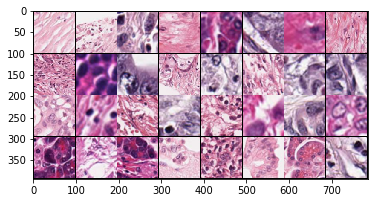

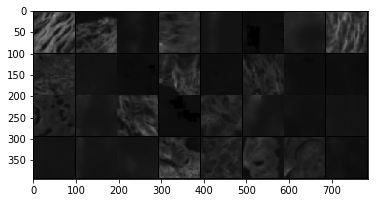

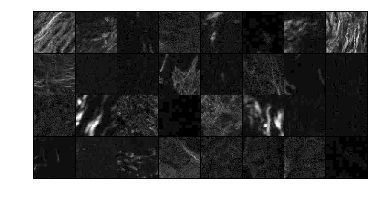

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


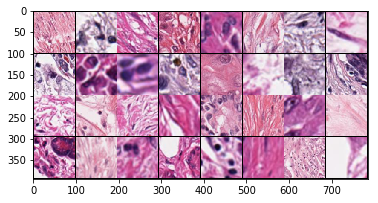

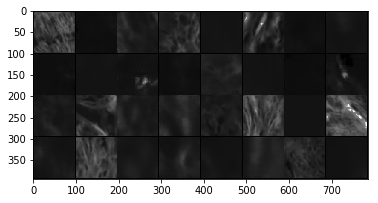

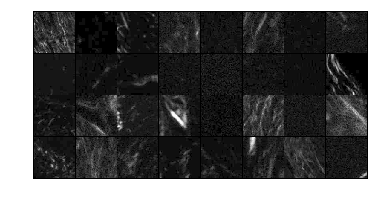

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


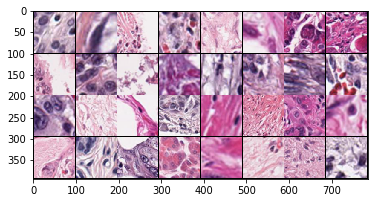

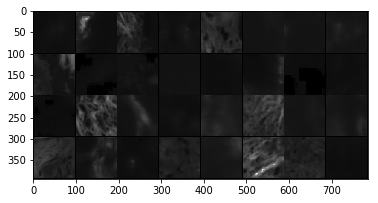

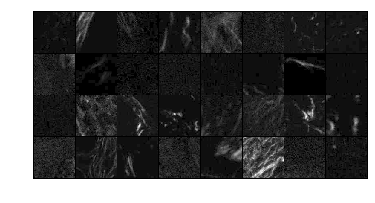

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


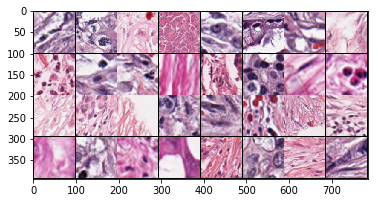

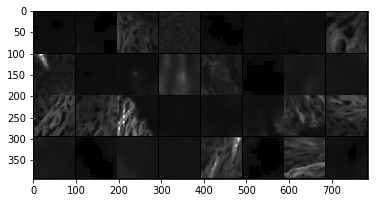

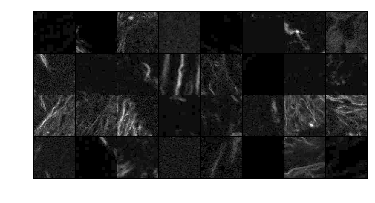

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


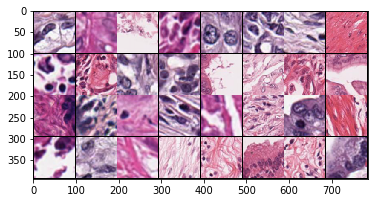

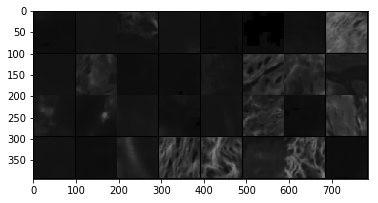

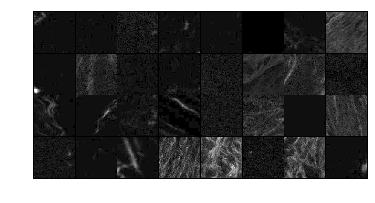

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


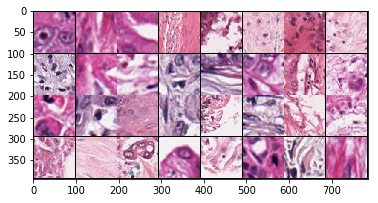

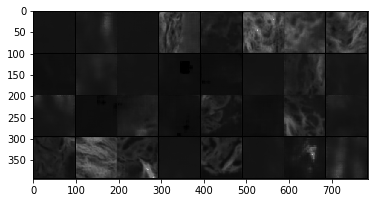

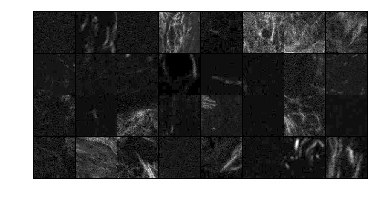

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


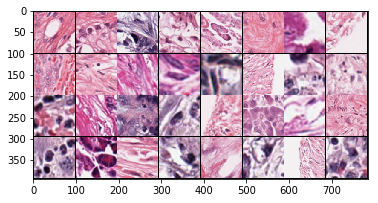

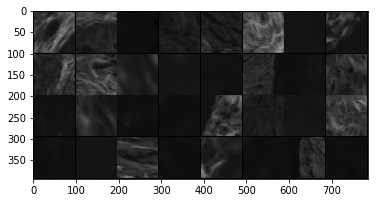

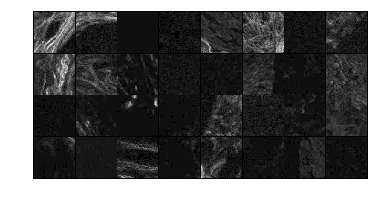

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


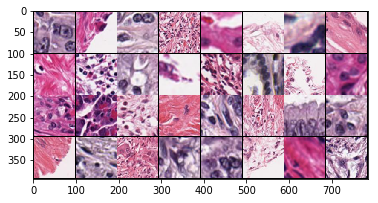

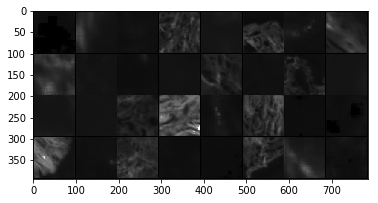

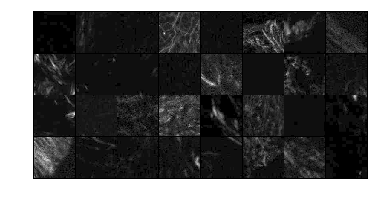

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


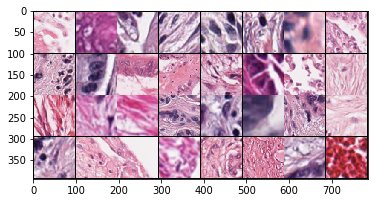

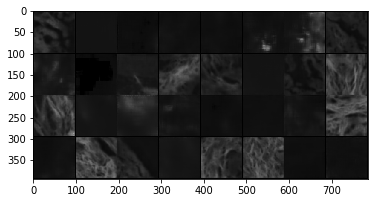

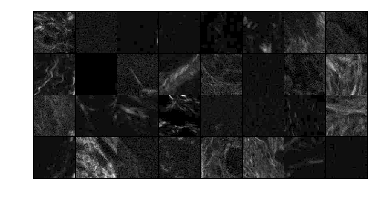

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


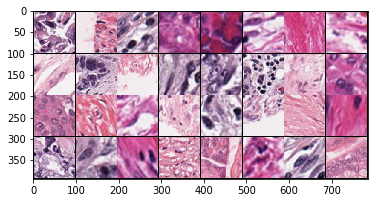

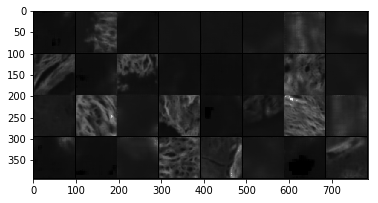

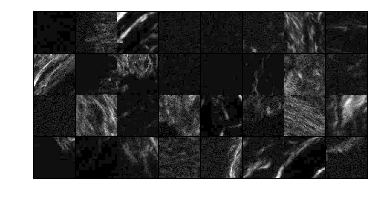

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


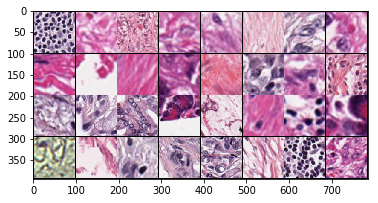

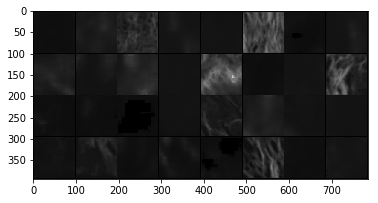

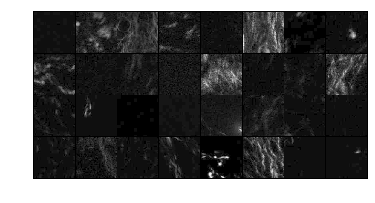

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


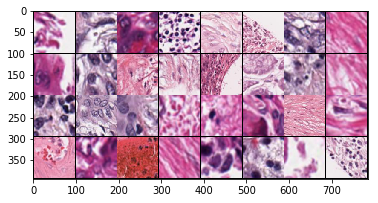

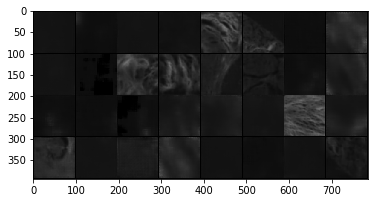

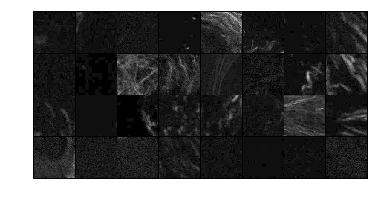

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


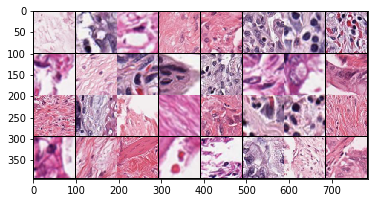

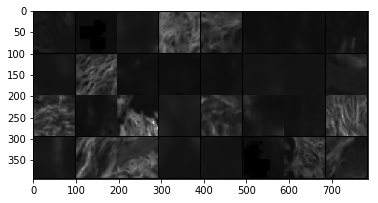

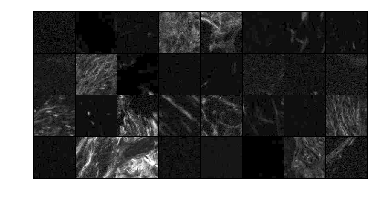

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


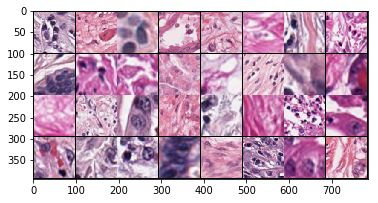

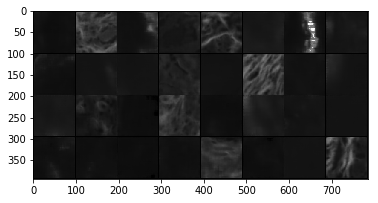

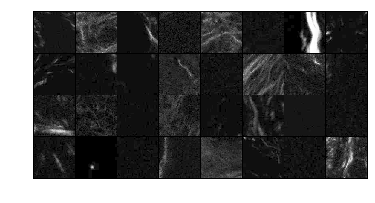

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


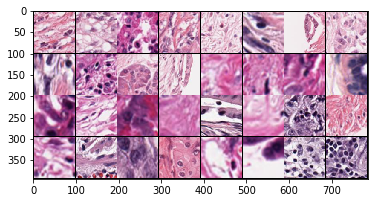

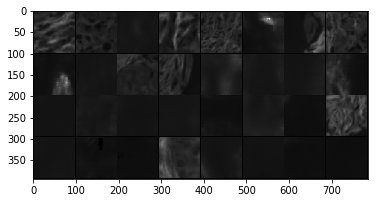

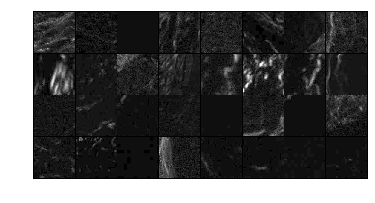

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


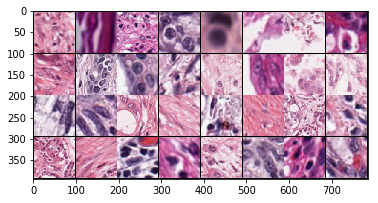

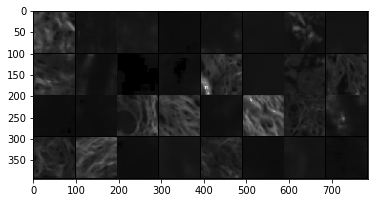

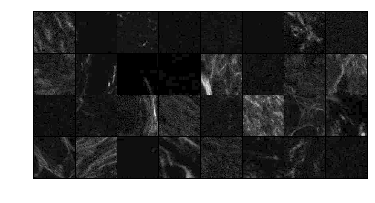

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


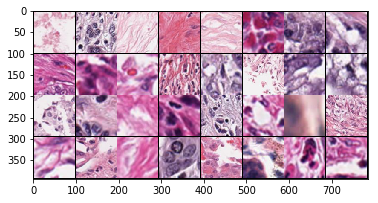

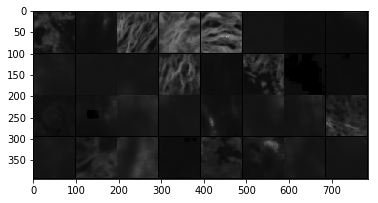

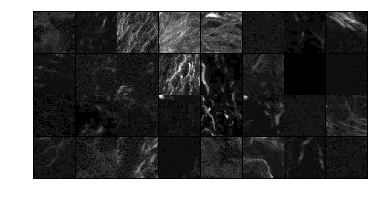

In [9]:
test()

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


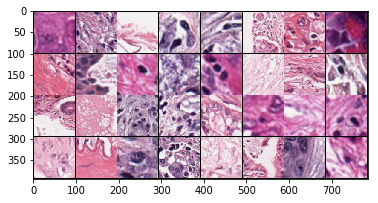

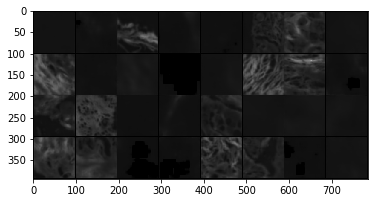

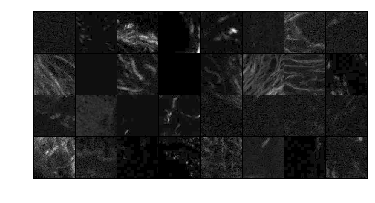

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


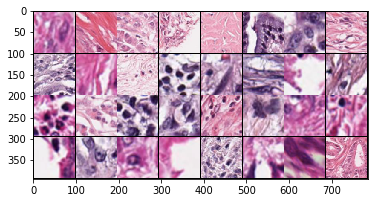

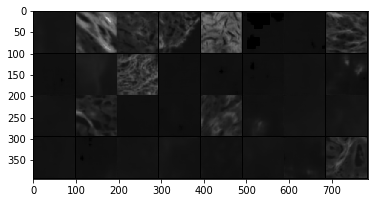

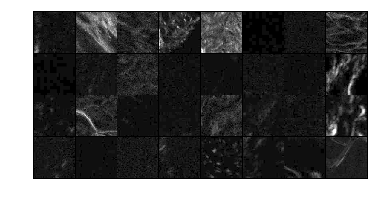

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


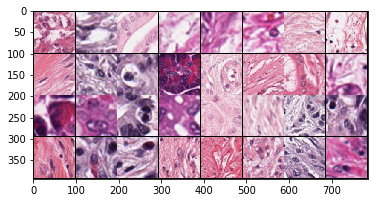

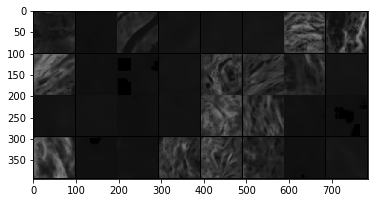

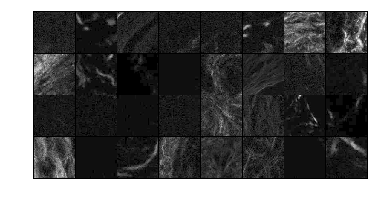

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


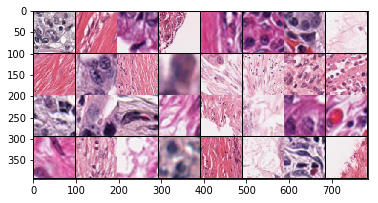

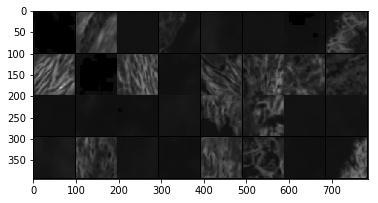

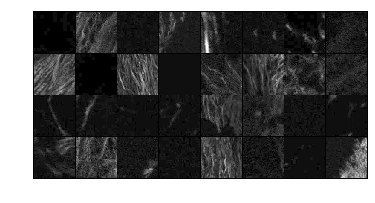

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


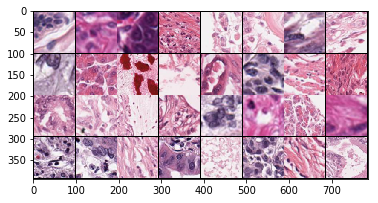

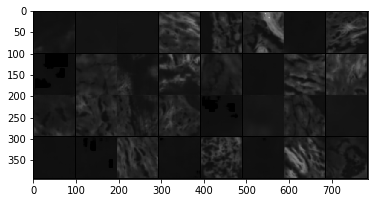

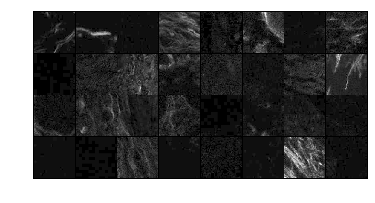

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


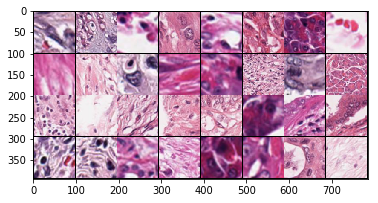

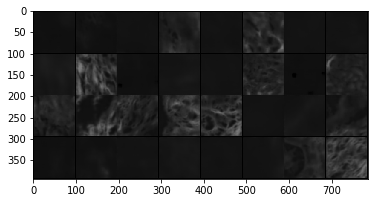

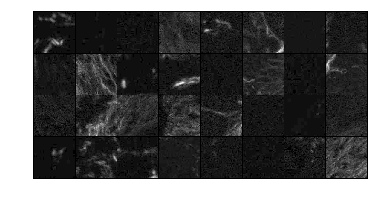

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


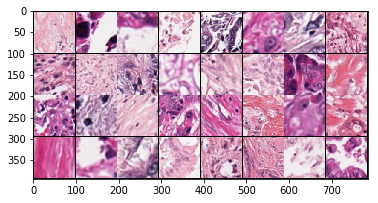

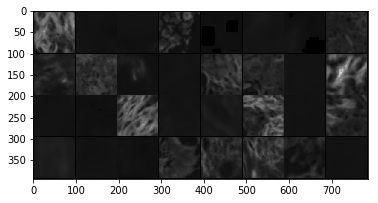

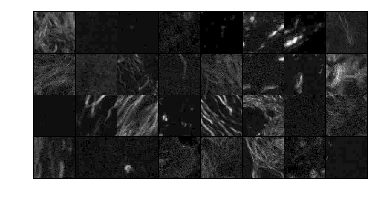

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


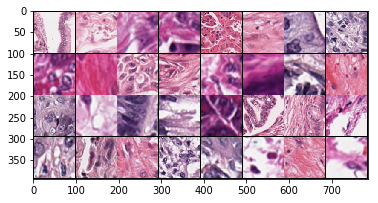

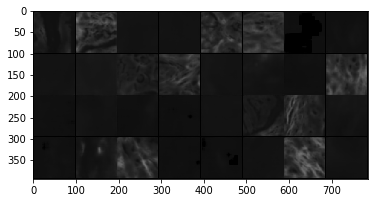

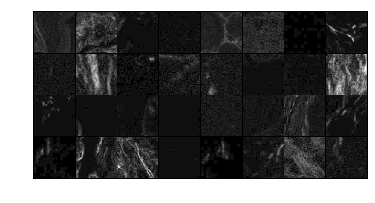

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


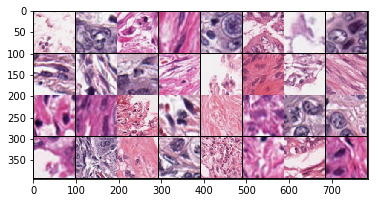

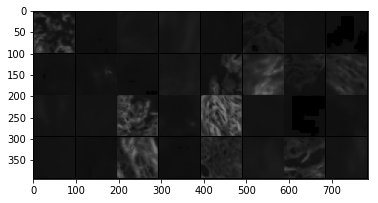

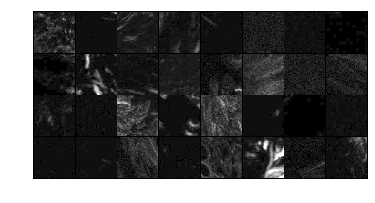

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


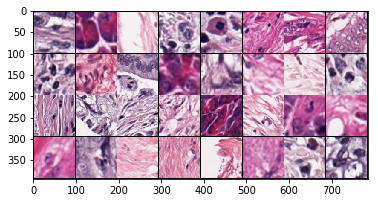

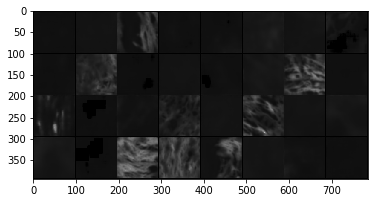

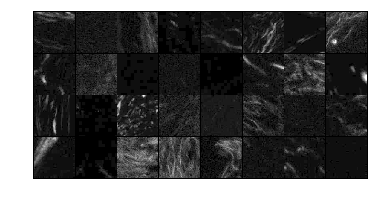

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


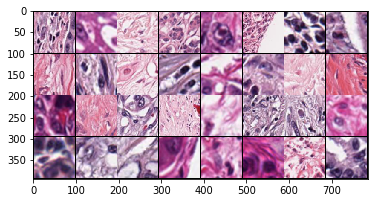

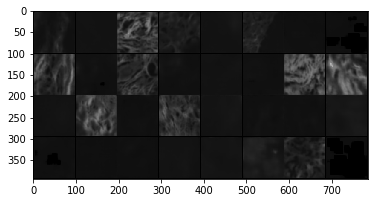

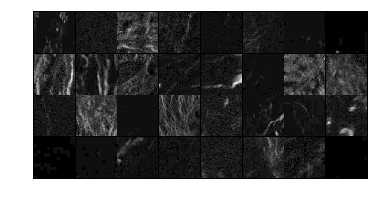

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


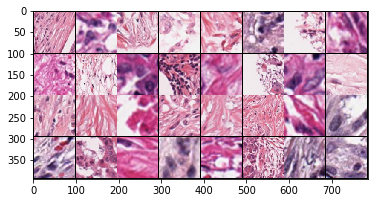

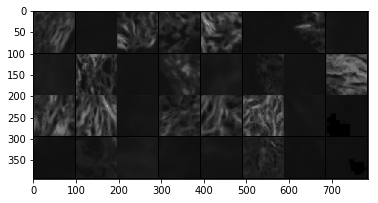

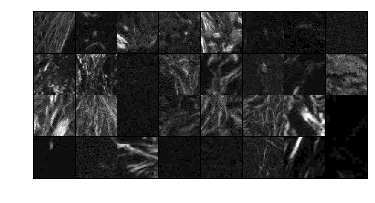

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


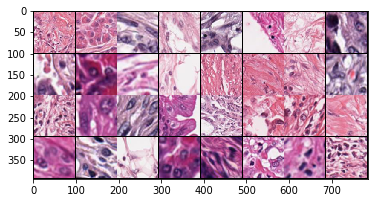

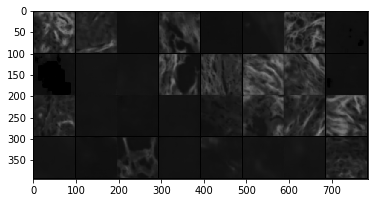

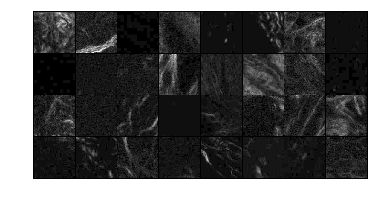

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


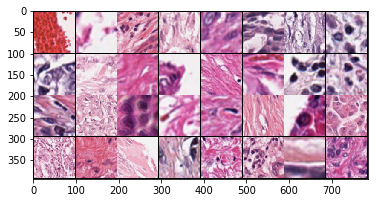

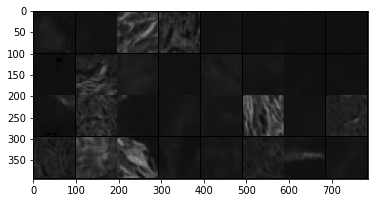

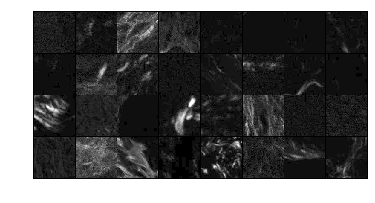

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


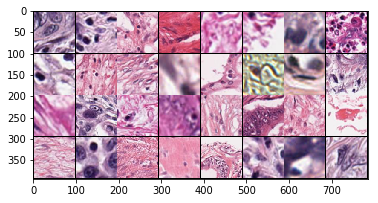

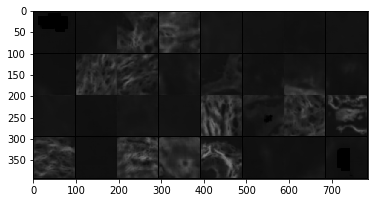

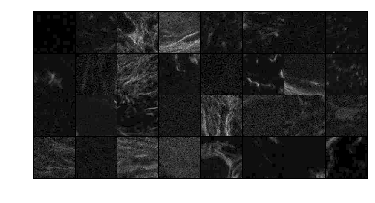

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


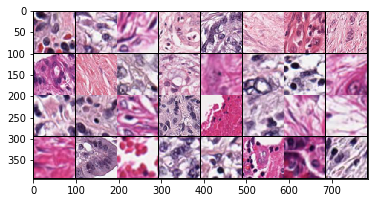

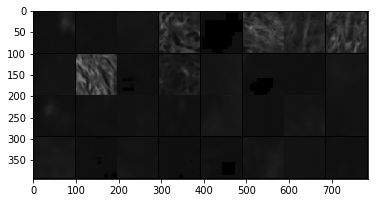

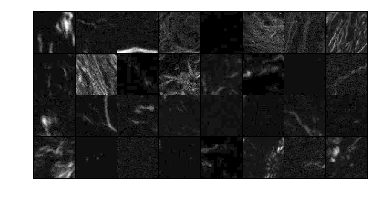

torch.Size([960, 1, 96, 96]) torch.Size([960, 96, 96])
torch.Size([32, 1, 96, 96])


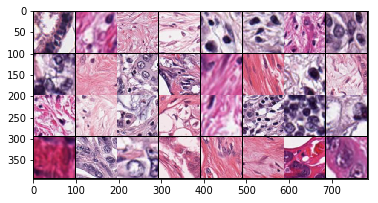

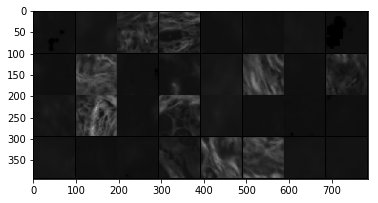

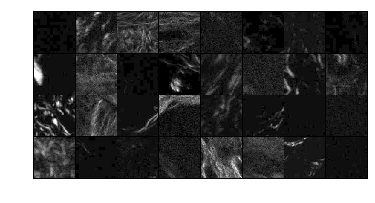

In [16]:
test()

In [11]:
p = 0
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001, betas=(0.5, 0.999))
# generator.apply(md.weights_init_normal)
# discriminator.apply(md.weights_init_normal)
Save_generator_path=os.path.join(save_path)

windowsize = 11
for epoch in range(1, 200 + 1):
        
    train(epoch, p, windowsize)

lossL1: 0.053803641349077225 lossSSIM: 0.43506133556365967
===> Epoch[1](0/1204): Loss: 0.4351
lossL1: 0.05429106205701828 lossSSIM: 0.43595433235168457
===> Epoch[1](50/1204): Loss: 0.4360
lossL1: 0.05437856912612915 lossSSIM: 0.4205731749534607
===> Epoch[1](100/1204): Loss: 0.4206
lossL1: 0.054101623594760895 lossSSIM: 0.4313153624534607
===> Epoch[1](150/1204): Loss: 0.4313
lossL1: 0.05398423224687576 lossSSIM: 0.4344509243965149
===> Epoch[1](200/1204): Loss: 0.4345
lossL1: 0.05271359533071518 lossSSIM: 0.42745471000671387
===> Epoch[1](250/1204): Loss: 0.4275
lossL1: 0.054959800094366074 lossSSIM: 0.4344850182533264
===> Epoch[1](300/1204): Loss: 0.4345
lossL1: 0.05327665060758591 lossSSIM: 0.43093931674957275
===> Epoch[1](350/1204): Loss: 0.4309
lossL1: 0.05456503480672836 lossSSIM: 0.43448859453201294
===> Epoch[1](400/1204): Loss: 0.4345
lossL1: 0.05251564458012581 lossSSIM: 0.4199449419975281
===> Epoch[1](450/1204): Loss: 0.4199
lossL1: 0.05566630885004997 lossSSIM: 0.43583

KeyboardInterrupt: 

In [8]:
p = 0.0
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005, betas=(0.8, 0.999))
# generator.apply(md.weights_init_normal)
# discriminator.apply(md.weights_init_normal)
Save_generator_path=os.path.join(save_path)

windowsize = 11
for epoch in range(1, 200 + 1):
        
    train(epoch, p, windowsize)

lossL1: 0.036428533494472504 lossSSIM: 0.35890406370162964
===> Epoch[1](0/368): Loss: 0.3589
lossL1: 0.03805237263441086 lossSSIM: 0.37372541427612305
===> Epoch[1](50/368): Loss: 0.3737
lossL1: 0.038718853145837784 lossSSIM: 0.3747648596763611
===> Epoch[1](100/368): Loss: 0.3748
lossL1: 0.03962697833776474 lossSSIM: 0.3655124306678772
===> Epoch[1](150/368): Loss: 0.3655
lossL1: 0.03866985812783241 lossSSIM: 0.36764270067214966
===> Epoch[1](200/368): Loss: 0.3676
lossL1: 0.03904141113162041 lossSSIM: 0.3747556209564209
===> Epoch[1](250/368): Loss: 0.3748
lossL1: 0.03884057700634003 lossSSIM: 0.3742743730545044
===> Epoch[1](300/368): Loss: 0.3743
lossL1: 0.03962455689907074 lossSSIM: 0.37754446268081665
===> Epoch[1](350/368): Loss: 0.3775
===> Epoch 1 Complete: Avg. Loss: 0.3685
lossL1: 0.037305813282728195 lossSSIM: 0.3636651039123535
===> Epoch[2](0/368): Loss: 0.3637
lossL1: 0.037172652781009674 lossSSIM: 0.3617708086967468
===> Epoch[2](50/368): Loss: 0.3618
lossL1: 0.0389307

lossL1: 0.03754740580916405 lossSSIM: 0.36516284942626953
===> Epoch[11](150/368): Loss: 0.3652
lossL1: 0.03893423080444336 lossSSIM: 0.36738258600234985
===> Epoch[11](200/368): Loss: 0.3674
lossL1: 0.03939056769013405 lossSSIM: 0.36469823122024536
===> Epoch[11](250/368): Loss: 0.3647
lossL1: 0.04066211357712746 lossSSIM: 0.3816646337509155
===> Epoch[11](300/368): Loss: 0.3817
lossL1: 0.03797343373298645 lossSSIM: 0.36511534452438354
===> Epoch[11](350/368): Loss: 0.3651
===> Epoch 11 Complete: Avg. Loss: 0.3674
lossL1: 0.038096003234386444 lossSSIM: 0.3695131540298462
===> Epoch[12](0/368): Loss: 0.3695
lossL1: 0.0369439460337162 lossSSIM: 0.3625043034553528
===> Epoch[12](50/368): Loss: 0.3625
lossL1: 0.04045076668262482 lossSSIM: 0.3857647180557251
===> Epoch[12](100/368): Loss: 0.3858
lossL1: 0.036881908774375916 lossSSIM: 0.35688936710357666
===> Epoch[12](150/368): Loss: 0.3569
lossL1: 0.036932408809661865 lossSSIM: 0.3564000129699707
===> Epoch[12](200/368): Loss: 0.3564
loss

lossL1: 0.038796015083789825 lossSSIM: 0.37201547622680664
===> Epoch[21](250/368): Loss: 0.3720
lossL1: 0.03847384452819824 lossSSIM: 0.3703603744506836
===> Epoch[21](300/368): Loss: 0.3704
lossL1: 0.03713110834360123 lossSSIM: 0.35926681756973267
===> Epoch[21](350/368): Loss: 0.3593
===> Epoch 21 Complete: Avg. Loss: 0.3665
lossL1: 0.0378035232424736 lossSSIM: 0.36268848180770874
===> Epoch[22](0/368): Loss: 0.3627
lossL1: 0.03763282671570778 lossSSIM: 0.3677177429199219
===> Epoch[22](50/368): Loss: 0.3677
lossL1: 0.037535160779953 lossSSIM: 0.3575170636177063
===> Epoch[22](100/368): Loss: 0.3575
lossL1: 0.04000415280461311 lossSSIM: 0.3819360136985779
===> Epoch[22](150/368): Loss: 0.3819
lossL1: 0.037862569093704224 lossSSIM: 0.3618564009666443
===> Epoch[22](200/368): Loss: 0.3619
lossL1: 0.03947937861084938 lossSSIM: 0.37063199281692505
===> Epoch[22](250/368): Loss: 0.3706
lossL1: 0.03827589750289917 lossSSIM: 0.3749668002128601
===> Epoch[22](300/368): Loss: 0.3750
lossL1: 

lossL1: 0.037751298397779465 lossSSIM: 0.3572843074798584
===> Epoch[31](350/368): Loss: 0.3573
===> Epoch 31 Complete: Avg. Loss: 0.3657
lossL1: 0.03674635291099548 lossSSIM: 0.3688795566558838
===> Epoch[32](0/368): Loss: 0.3689
lossL1: 0.03724142163991928 lossSSIM: 0.36396950483322144
===> Epoch[32](50/368): Loss: 0.3640
lossL1: 0.035771444439888 lossSSIM: 0.3527768850326538
===> Epoch[32](100/368): Loss: 0.3528
lossL1: 0.038251981139183044 lossSSIM: 0.36651283502578735
===> Epoch[32](150/368): Loss: 0.3665
lossL1: 0.037965208292007446 lossSSIM: 0.3686031103134155
===> Epoch[32](200/368): Loss: 0.3686
lossL1: 0.03702137991786003 lossSSIM: 0.34992873668670654
===> Epoch[32](250/368): Loss: 0.3499
lossL1: 0.03738123178482056 lossSSIM: 0.3558729290962219
===> Epoch[32](300/368): Loss: 0.3559
lossL1: 0.03852517157793045 lossSSIM: 0.37459272146224976
===> Epoch[32](350/368): Loss: 0.3746
===> Epoch 32 Complete: Avg. Loss: 0.3656
lossL1: 0.03941606357693672 lossSSIM: 0.37514573335647583
=

KeyboardInterrupt: 

In [11]:
p = 0.0
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005, betas=(0.9, 0.999))
# generator.apply(md.weights_init_normal)
# discriminator.apply(md.weights_init_normal)
Save_generator_path=os.path.join(save_path)

windowsize = 11
for epoch in range(1, 200 + 1):
        
    train(epoch, p, windowsize)

lossL1: 0.03792329132556915 lossSSIM: 0.37658053636550903
===> Epoch[1](0/386): Loss: 0.3766
lossL1: 0.04045361652970314 lossSSIM: 0.37891143560409546
===> Epoch[1](50/386): Loss: 0.3789
lossL1: 0.03710850328207016 lossSSIM: 0.3645511865615845
===> Epoch[1](100/386): Loss: 0.3646
lossL1: 0.03887245059013367 lossSSIM: 0.36966949701309204
===> Epoch[1](150/386): Loss: 0.3697
lossL1: 0.03859550133347511 lossSSIM: 0.3770751953125
===> Epoch[1](200/386): Loss: 0.3771
lossL1: 0.03687727451324463 lossSSIM: 0.37136387825012207
===> Epoch[1](250/386): Loss: 0.3714
lossL1: 0.0373372957110405 lossSSIM: 0.3705196976661682
===> Epoch[1](300/386): Loss: 0.3705
lossL1: 0.03835650160908699 lossSSIM: 0.36870241165161133
===> Epoch[1](350/386): Loss: 0.3687
===> Epoch 1 Complete: Avg. Loss: 0.3744
lossL1: 0.03836696594953537 lossSSIM: 0.3702048659324646
===> Epoch[2](0/386): Loss: 0.3702
lossL1: 0.03904472291469574 lossSSIM: 0.3830885887145996
===> Epoch[2](50/386): Loss: 0.3831
lossL1: 0.03828085213899

lossL1: 0.0376315638422966 lossSSIM: 0.37347251176834106
===> Epoch[11](150/386): Loss: 0.3735
lossL1: 0.03973875194787979 lossSSIM: 0.38276880979537964
===> Epoch[11](200/386): Loss: 0.3828
lossL1: 0.04128945246338844 lossSSIM: 0.3876710534095764
===> Epoch[11](250/386): Loss: 0.3877
lossL1: 0.0393562912940979 lossSSIM: 0.379722535610199
===> Epoch[11](300/386): Loss: 0.3797
lossL1: 0.03853261470794678 lossSSIM: 0.3711249828338623
===> Epoch[11](350/386): Loss: 0.3711
===> Epoch 11 Complete: Avg. Loss: 0.3735
lossL1: 0.037787649780511856 lossSSIM: 0.37814366817474365
===> Epoch[12](0/386): Loss: 0.3781
lossL1: 0.03874794393777847 lossSSIM: 0.37586307525634766
===> Epoch[12](50/386): Loss: 0.3759
lossL1: 0.038949787616729736 lossSSIM: 0.3804439306259155
===> Epoch[12](100/386): Loss: 0.3804
lossL1: 0.0386706218123436 lossSSIM: 0.3831860423088074
===> Epoch[12](150/386): Loss: 0.3832
lossL1: 0.039210423827171326 lossSSIM: 0.3841897249221802
===> Epoch[12](200/386): Loss: 0.3842
lossL1: 

lossL1: 0.038171205669641495 lossSSIM: 0.3701361417770386
===> Epoch[21](250/386): Loss: 0.3701
lossL1: 0.03883109241724014 lossSSIM: 0.3771807551383972
===> Epoch[21](300/386): Loss: 0.3772
lossL1: 0.03752864897251129 lossSSIM: 0.36523330211639404
===> Epoch[21](350/386): Loss: 0.3652
===> Epoch 21 Complete: Avg. Loss: 0.3730
lossL1: 0.03644194453954697 lossSSIM: 0.36239707469940186
===> Epoch[22](0/386): Loss: 0.3624
lossL1: 0.040268104523420334 lossSSIM: 0.3874662518501282
===> Epoch[22](50/386): Loss: 0.3875
lossL1: 0.03910946846008301 lossSSIM: 0.373900830745697
===> Epoch[22](100/386): Loss: 0.3739
lossL1: 0.03543685004115105 lossSSIM: 0.35122907161712646
===> Epoch[22](150/386): Loss: 0.3512
lossL1: 0.03932264447212219 lossSSIM: 0.3808441758155823
===> Epoch[22](200/386): Loss: 0.3808
lossL1: 0.0389927439391613 lossSSIM: 0.37232041358947754
===> Epoch[22](250/386): Loss: 0.3723
lossL1: 0.03932657092809677 lossSSIM: 0.3866422176361084
===> Epoch[22](300/386): Loss: 0.3866
lossL1:

lossL1: 0.03736170381307602 lossSSIM: 0.37249326705932617
===> Epoch[31](350/386): Loss: 0.3725
===> Epoch 31 Complete: Avg. Loss: 0.3724
lossL1: 0.039567966014146805 lossSSIM: 0.3797875642776489
===> Epoch[32](0/386): Loss: 0.3798
lossL1: 0.03786127641797066 lossSSIM: 0.37302249670028687
===> Epoch[32](50/386): Loss: 0.3730
lossL1: 0.0401788204908371 lossSSIM: 0.3799874186515808
===> Epoch[32](100/386): Loss: 0.3800
lossL1: 0.039098307490348816 lossSSIM: 0.37356483936309814
===> Epoch[32](150/386): Loss: 0.3736
lossL1: 0.037242427468299866 lossSSIM: 0.3617551326751709
===> Epoch[32](200/386): Loss: 0.3618
lossL1: 0.037299904972314835 lossSSIM: 0.36083608865737915
===> Epoch[32](250/386): Loss: 0.3608
lossL1: 0.03666658699512482 lossSSIM: 0.35914140939712524
===> Epoch[32](300/386): Loss: 0.3591
lossL1: 0.03871295228600502 lossSSIM: 0.3769643306732178
===> Epoch[32](350/386): Loss: 0.3770
===> Epoch 32 Complete: Avg. Loss: 0.3724
lossL1: 0.03908199071884155 lossSSIM: 0.3755460381507873

lossL1: 0.03647488355636597 lossSSIM: 0.3558650612831116
===> Epoch[42](50/386): Loss: 0.3559
lossL1: 0.03856585547327995 lossSSIM: 0.36971694231033325
===> Epoch[42](100/386): Loss: 0.3697
lossL1: 0.03888210654258728 lossSSIM: 0.38010579347610474
===> Epoch[42](150/386): Loss: 0.3801
lossL1: 0.039832767099142075 lossSSIM: 0.3805636167526245
===> Epoch[42](200/386): Loss: 0.3806
lossL1: 0.037470001727342606 lossSSIM: 0.36280709505081177
===> Epoch[42](250/386): Loss: 0.3628
lossL1: 0.03888371214270592 lossSSIM: 0.3663211464881897
===> Epoch[42](300/386): Loss: 0.3663
lossL1: 0.03672824054956436 lossSSIM: 0.35853320360183716
===> Epoch[42](350/386): Loss: 0.3585
===> Epoch 42 Complete: Avg. Loss: 0.3720
lossL1: 0.037178657948970795 lossSSIM: 0.370111882686615
===> Epoch[43](0/386): Loss: 0.3701
lossL1: 0.03763013705611229 lossSSIM: 0.3619610667228699
===> Epoch[43](50/386): Loss: 0.3620
lossL1: 0.03793937340378761 lossSSIM: 0.3649175763130188
===> Epoch[43](100/386): Loss: 0.3649
lossL1

lossL1: 0.03822099044919014 lossSSIM: 0.3732948303222656
===> Epoch[52](150/386): Loss: 0.3733
lossL1: 0.03757398948073387 lossSSIM: 0.37122100591659546
===> Epoch[52](200/386): Loss: 0.3712
lossL1: 0.03745496645569801 lossSSIM: 0.3665429949760437
===> Epoch[52](250/386): Loss: 0.3665
lossL1: 0.03843342140316963 lossSSIM: 0.3706761598587036
===> Epoch[52](300/386): Loss: 0.3707
lossL1: 0.03797402232885361 lossSSIM: 0.37122786045074463
===> Epoch[52](350/386): Loss: 0.3712
===> Epoch 52 Complete: Avg. Loss: 0.3715
lossL1: 0.037186622619628906 lossSSIM: 0.3650309443473816
===> Epoch[53](0/386): Loss: 0.3650
lossL1: 0.03645797818899155 lossSSIM: 0.36258649826049805
===> Epoch[53](50/386): Loss: 0.3626
lossL1: 0.040154509246349335 lossSSIM: 0.38152581453323364
===> Epoch[53](100/386): Loss: 0.3815
lossL1: 0.038859784603118896 lossSSIM: 0.3768686056137085
===> Epoch[53](150/386): Loss: 0.3769
lossL1: 0.036565251648426056 lossSSIM: 0.3620733618736267
===> Epoch[53](200/386): Loss: 0.3621
los

lossL1: 0.038664672523736954 lossSSIM: 0.37604981660842896
===> Epoch[62](250/386): Loss: 0.3760
lossL1: 0.03847628831863403 lossSSIM: 0.37039250135421753
===> Epoch[62](300/386): Loss: 0.3704
lossL1: 0.038338690996170044 lossSSIM: 0.38055646419525146
===> Epoch[62](350/386): Loss: 0.3806
===> Epoch 62 Complete: Avg. Loss: 0.3712
lossL1: 0.0370672345161438 lossSSIM: 0.3598787188529968
===> Epoch[63](0/386): Loss: 0.3599
lossL1: 0.0382731631398201 lossSSIM: 0.36909955739974976
===> Epoch[63](50/386): Loss: 0.3691
lossL1: 0.0390653982758522 lossSSIM: 0.38034164905548096
===> Epoch[63](100/386): Loss: 0.3803
lossL1: 0.03813251480460167 lossSSIM: 0.36603838205337524
===> Epoch[63](150/386): Loss: 0.3660
lossL1: 0.04069621115922928 lossSSIM: 0.39184290170669556
===> Epoch[63](200/386): Loss: 0.3918
lossL1: 0.03760876506567001 lossSSIM: 0.3623057007789612
===> Epoch[63](250/386): Loss: 0.3623
lossL1: 0.03841166943311691 lossSSIM: 0.37691056728363037
===> Epoch[63](300/386): Loss: 0.3769
loss

lossL1: 0.038423895835876465 lossSSIM: 0.3732193112373352
===> Epoch[72](350/386): Loss: 0.3732
===> Epoch 72 Complete: Avg. Loss: 0.3708
lossL1: 0.038354307413101196 lossSSIM: 0.36751389503479004
===> Epoch[73](0/386): Loss: 0.3675
lossL1: 0.03625670447945595 lossSSIM: 0.36336541175842285
===> Epoch[73](50/386): Loss: 0.3634
lossL1: 0.038457389920949936 lossSSIM: 0.3720164895057678
===> Epoch[73](100/386): Loss: 0.3720
lossL1: 0.036513008177280426 lossSSIM: 0.3578992486000061
===> Epoch[73](150/386): Loss: 0.3579
lossL1: 0.038337092846632004 lossSSIM: 0.37540292739868164
===> Epoch[73](200/386): Loss: 0.3754
lossL1: 0.03879843279719353 lossSSIM: 0.3667711615562439
===> Epoch[73](250/386): Loss: 0.3668
lossL1: 0.037429723888635635 lossSSIM: 0.3649636507034302
===> Epoch[73](300/386): Loss: 0.3650
lossL1: 0.039429694414138794 lossSSIM: 0.37427055835723877
===> Epoch[73](350/386): Loss: 0.3743
===> Epoch 73 Complete: Avg. Loss: 0.3708
lossL1: 0.039827845990657806 lossSSIM: 0.375432014465

lossL1: 0.03786168247461319 lossSSIM: 0.3773176074028015
===> Epoch[83](50/386): Loss: 0.3773
lossL1: 0.04130703955888748 lossSSIM: 0.3944322466850281
===> Epoch[83](100/386): Loss: 0.3944
lossL1: 0.038162048906087875 lossSSIM: 0.3723267912864685
===> Epoch[83](150/386): Loss: 0.3723
lossL1: 0.03857069090008736 lossSSIM: 0.3730323910713196
===> Epoch[83](200/386): Loss: 0.3730
lossL1: 0.03627636283636093 lossSSIM: 0.35492753982543945
===> Epoch[83](250/386): Loss: 0.3549
lossL1: 0.03685784339904785 lossSSIM: 0.36328327655792236
===> Epoch[83](300/386): Loss: 0.3633
lossL1: 0.03503098338842392 lossSSIM: 0.3497909903526306
===> Epoch[83](350/386): Loss: 0.3498
===> Epoch 83 Complete: Avg. Loss: 0.3704
lossL1: 0.037195079028606415 lossSSIM: 0.36400777101516724
===> Epoch[84](0/386): Loss: 0.3640
lossL1: 0.03798307478427887 lossSSIM: 0.3686477541923523
===> Epoch[84](50/386): Loss: 0.3686
lossL1: 0.039258312433958054 lossSSIM: 0.3856702446937561
===> Epoch[84](100/386): Loss: 0.3857
lossL1

lossL1: 0.038100749254226685 lossSSIM: 0.37722277641296387
===> Epoch[93](150/386): Loss: 0.3772
lossL1: 0.039568398147821426 lossSSIM: 0.37951982021331787
===> Epoch[93](200/386): Loss: 0.3795
lossL1: 0.038085244596004486 lossSSIM: 0.36557573080062866
===> Epoch[93](250/386): Loss: 0.3656
lossL1: 0.03892950341105461 lossSSIM: 0.38024771213531494
===> Epoch[93](300/386): Loss: 0.3802
lossL1: 0.03683987259864807 lossSSIM: 0.36636340618133545
===> Epoch[93](350/386): Loss: 0.3664
===> Epoch 93 Complete: Avg. Loss: 0.3701
lossL1: 0.03821706771850586 lossSSIM: 0.36542004346847534
===> Epoch[94](0/386): Loss: 0.3654
lossL1: 0.037737682461738586 lossSSIM: 0.37710434198379517
===> Epoch[94](50/386): Loss: 0.3771
lossL1: 0.038618311285972595 lossSSIM: 0.3649764060974121
===> Epoch[94](100/386): Loss: 0.3650
lossL1: 0.03998690843582153 lossSSIM: 0.3914504647254944
===> Epoch[94](150/386): Loss: 0.3915
lossL1: 0.03772793710231781 lossSSIM: 0.3661426305770874
===> Epoch[94](200/386): Loss: 0.3661

lossL1: 0.037677913904190063 lossSSIM: 0.37225836515426636
===> Epoch[103](250/386): Loss: 0.3723
lossL1: 0.03827245533466339 lossSSIM: 0.38168442249298096
===> Epoch[103](300/386): Loss: 0.3817
lossL1: 0.0376664362847805 lossSSIM: 0.3701164126396179
===> Epoch[103](350/386): Loss: 0.3701
===> Epoch 103 Complete: Avg. Loss: 0.3699
lossL1: 0.03738509863615036 lossSSIM: 0.3800240755081177
===> Epoch[104](0/386): Loss: 0.3800
lossL1: 0.03843262046575546 lossSSIM: 0.3778885006904602
===> Epoch[104](50/386): Loss: 0.3779
lossL1: 0.03681670129299164 lossSSIM: 0.36269712448120117
===> Epoch[104](100/386): Loss: 0.3627
lossL1: 0.03673276677727699 lossSSIM: 0.35757774114608765
===> Epoch[104](150/386): Loss: 0.3576
lossL1: 0.037697430700063705 lossSSIM: 0.367792546749115
===> Epoch[104](200/386): Loss: 0.3678
lossL1: 0.03841041401028633 lossSSIM: 0.3746698498725891
===> Epoch[104](250/386): Loss: 0.3747
lossL1: 0.03689877688884735 lossSSIM: 0.36461174488067627
===> Epoch[104](300/386): Loss: 0.

lossL1: 0.0365055613219738 lossSSIM: 0.3531609773635864
===> Epoch[113](300/386): Loss: 0.3532
lossL1: 0.03650814667344093 lossSSIM: 0.3678414225578308
===> Epoch[113](350/386): Loss: 0.3678
===> Epoch 113 Complete: Avg. Loss: 0.3696
lossL1: 0.03741087019443512 lossSSIM: 0.35973912477493286
===> Epoch[114](0/386): Loss: 0.3597
lossL1: 0.03517243266105652 lossSSIM: 0.3467581868171692
===> Epoch[114](50/386): Loss: 0.3468
lossL1: 0.039088379591703415 lossSSIM: 0.37413978576660156
===> Epoch[114](100/386): Loss: 0.3741
lossL1: 0.03828791156411171 lossSSIM: 0.3720162510871887
===> Epoch[114](150/386): Loss: 0.3720
lossL1: 0.038126390427351 lossSSIM: 0.3635391592979431
===> Epoch[114](200/386): Loss: 0.3635
lossL1: 0.03786184638738632 lossSSIM: 0.36465150117874146
===> Epoch[114](250/386): Loss: 0.3647
lossL1: 0.03751862421631813 lossSSIM: 0.3668578863143921
===> Epoch[114](300/386): Loss: 0.3669
lossL1: 0.03944474458694458 lossSSIM: 0.3820314407348633
===> Epoch[114](350/386): Loss: 0.3820

lossL1: 0.037873901426792145 lossSSIM: 0.3684079051017761
===> Epoch[123](350/386): Loss: 0.3684
===> Epoch 123 Complete: Avg. Loss: 0.3693
lossL1: 0.03643239289522171 lossSSIM: 0.3638659715652466
===> Epoch[124](0/386): Loss: 0.3639
lossL1: 0.03750581294298172 lossSSIM: 0.3664841651916504
===> Epoch[124](50/386): Loss: 0.3665
lossL1: 0.036162957549095154 lossSSIM: 0.35667848587036133
===> Epoch[124](100/386): Loss: 0.3567
lossL1: 0.039419058710336685 lossSSIM: 0.3810715675354004
===> Epoch[124](150/386): Loss: 0.3811
lossL1: 0.037197161465883255 lossSSIM: 0.36068785190582275
===> Epoch[124](200/386): Loss: 0.3607
lossL1: 0.04010578617453575 lossSSIM: 0.3786751627922058
===> Epoch[124](250/386): Loss: 0.3787
lossL1: 0.038590382784605026 lossSSIM: 0.3711709976196289
===> Epoch[124](300/386): Loss: 0.3712
lossL1: 0.03684389591217041 lossSSIM: 0.3643742799758911
===> Epoch[124](350/386): Loss: 0.3644
===> Epoch 124 Complete: Avg. Loss: 0.3693
lossL1: 0.0387420691549778 lossSSIM: 0.3728659

===> Epoch 133 Complete: Avg. Loss: 0.3691
lossL1: 0.03869003802537918 lossSSIM: 0.37920933961868286
===> Epoch[134](0/386): Loss: 0.3792
lossL1: 0.03865377604961395 lossSSIM: 0.37686675786972046
===> Epoch[134](50/386): Loss: 0.3769
lossL1: 0.03583775833249092 lossSSIM: 0.35667967796325684
===> Epoch[134](100/386): Loss: 0.3567
lossL1: 0.03729246184229851 lossSSIM: 0.373185932636261
===> Epoch[134](150/386): Loss: 0.3732
lossL1: 0.038140423595905304 lossSSIM: 0.36337900161743164
===> Epoch[134](200/386): Loss: 0.3634
lossL1: 0.03795163705945015 lossSSIM: 0.3620448112487793
===> Epoch[134](250/386): Loss: 0.3620
lossL1: 0.0375039242208004 lossSSIM: 0.3731996417045593
===> Epoch[134](300/386): Loss: 0.3732
lossL1: 0.03719852492213249 lossSSIM: 0.3697028160095215
===> Epoch[134](350/386): Loss: 0.3697
===> Epoch 134 Complete: Avg. Loss: 0.3691
lossL1: 0.03724738955497742 lossSSIM: 0.36216551065444946
===> Epoch[135](0/386): Loss: 0.3622
lossL1: 0.03912561759352684 lossSSIM: 0.37301564216

lossL1: 0.038375724107027054 lossSSIM: 0.36751770973205566
===> Epoch[144](50/386): Loss: 0.3675
lossL1: 0.036298785358667374 lossSSIM: 0.3584713339805603
===> Epoch[144](100/386): Loss: 0.3585
lossL1: 0.03780446574091911 lossSSIM: 0.36610889434814453
===> Epoch[144](150/386): Loss: 0.3661
lossL1: 0.0369298942387104 lossSSIM: 0.36155271530151367
===> Epoch[144](200/386): Loss: 0.3616
lossL1: 0.03723413124680519 lossSSIM: 0.3621200919151306
===> Epoch[144](250/386): Loss: 0.3621
lossL1: 0.037560462951660156 lossSSIM: 0.36034321784973145
===> Epoch[144](300/386): Loss: 0.3603
lossL1: 0.03876122459769249 lossSSIM: 0.3829200267791748
===> Epoch[144](350/386): Loss: 0.3829
===> Epoch 144 Complete: Avg. Loss: 0.3688
lossL1: 0.03752940893173218 lossSSIM: 0.36745691299438477
===> Epoch[145](0/386): Loss: 0.3675
lossL1: 0.03941062465310097 lossSSIM: 0.3846977949142456
===> Epoch[145](50/386): Loss: 0.3847
lossL1: 0.03859100490808487 lossSSIM: 0.3792117238044739
===> Epoch[145](100/386): Loss: 0

lossL1: 0.037887316197156906 lossSSIM: 0.37265723943710327
===> Epoch[154](100/386): Loss: 0.3727
lossL1: 0.039399709552526474 lossSSIM: 0.3790057897567749
===> Epoch[154](150/386): Loss: 0.3790
lossL1: 0.037801261991262436 lossSSIM: 0.3583604097366333
===> Epoch[154](200/386): Loss: 0.3584
lossL1: 0.038584183901548386 lossSSIM: 0.36887258291244507
===> Epoch[154](250/386): Loss: 0.3689
lossL1: 0.03813948854804039 lossSSIM: 0.3735543489456177
===> Epoch[154](300/386): Loss: 0.3736
lossL1: 0.03711409121751785 lossSSIM: 0.3634061813354492
===> Epoch[154](350/386): Loss: 0.3634
===> Epoch 154 Complete: Avg. Loss: 0.3686
lossL1: 0.03793725371360779 lossSSIM: 0.3662492632865906
===> Epoch[155](0/386): Loss: 0.3662
lossL1: 0.03787117078900337 lossSSIM: 0.360110878944397
===> Epoch[155](50/386): Loss: 0.3601
lossL1: 0.036196861416101456 lossSSIM: 0.362413227558136
===> Epoch[155](100/386): Loss: 0.3624
lossL1: 0.036818794906139374 lossSSIM: 0.3618272542953491
===> Epoch[155](150/386): Loss: 0

lossL1: 0.03785646706819534 lossSSIM: 0.36812788248062134
===> Epoch[164](150/386): Loss: 0.3681
lossL1: 0.03872886300086975 lossSSIM: 0.36568325757980347
===> Epoch[164](200/386): Loss: 0.3657
lossL1: 0.035741955041885376 lossSSIM: 0.3544299602508545
===> Epoch[164](250/386): Loss: 0.3544
lossL1: 0.03800521418452263 lossSSIM: 0.3728914260864258
===> Epoch[164](300/386): Loss: 0.3729
lossL1: 0.038451191037893295 lossSSIM: 0.3707006573677063
===> Epoch[164](350/386): Loss: 0.3707
===> Epoch 164 Complete: Avg. Loss: 0.3684
lossL1: 0.03751625120639801 lossSSIM: 0.3707777261734009
===> Epoch[165](0/386): Loss: 0.3708
lossL1: 0.03791514039039612 lossSSIM: 0.36398911476135254
===> Epoch[165](50/386): Loss: 0.3640
lossL1: 0.03738563135266304 lossSSIM: 0.3681732416152954
===> Epoch[165](100/386): Loss: 0.3682
lossL1: 0.035908959805965424 lossSSIM: 0.3562590479850769
===> Epoch[165](150/386): Loss: 0.3563
lossL1: 0.038498640060424805 lossSSIM: 0.37087899446487427
===> Epoch[165](200/386): Loss:

lossL1: 0.038527920842170715 lossSSIM: 0.37043899297714233
===> Epoch[174](200/386): Loss: 0.3704
lossL1: 0.037794940173625946 lossSSIM: 0.373041033744812
===> Epoch[174](250/386): Loss: 0.3730
lossL1: 0.03764719516038895 lossSSIM: 0.377371609210968
===> Epoch[174](300/386): Loss: 0.3774
lossL1: 0.03979773446917534 lossSSIM: 0.38900548219680786
===> Epoch[174](350/386): Loss: 0.3890
===> Epoch 174 Complete: Avg. Loss: 0.3682
lossL1: 0.03744916245341301 lossSSIM: 0.377315878868103
===> Epoch[175](0/386): Loss: 0.3773
lossL1: 0.038833923637866974 lossSSIM: 0.38107365369796753
===> Epoch[175](50/386): Loss: 0.3811
lossL1: 0.0383274108171463 lossSSIM: 0.3795003890991211
===> Epoch[175](100/386): Loss: 0.3795
lossL1: 0.03735097125172615 lossSSIM: 0.360934853553772
===> Epoch[175](150/386): Loss: 0.3609
lossL1: 0.0363171324133873 lossSSIM: 0.3623637557029724
===> Epoch[175](200/386): Loss: 0.3624
lossL1: 0.037710536271333694 lossSSIM: 0.3666456937789917
===> Epoch[175](250/386): Loss: 0.3666

lossL1: 0.03787299245595932 lossSSIM: 0.3695005178451538
===> Epoch[184](250/386): Loss: 0.3695
lossL1: 0.03949714079499245 lossSSIM: 0.37916553020477295
===> Epoch[184](300/386): Loss: 0.3792
lossL1: 0.03847261890769005 lossSSIM: 0.3745071291923523
===> Epoch[184](350/386): Loss: 0.3745
===> Epoch 184 Complete: Avg. Loss: 0.3680
lossL1: 0.03776583820581436 lossSSIM: 0.3705853223800659
===> Epoch[185](0/386): Loss: 0.3706
lossL1: 0.037573423236608505 lossSSIM: 0.3670690655708313
===> Epoch[185](50/386): Loss: 0.3671
lossL1: 0.037486542016267776 lossSSIM: 0.36418795585632324
===> Epoch[185](100/386): Loss: 0.3642
lossL1: 0.03759397566318512 lossSSIM: 0.36622506380081177
===> Epoch[185](150/386): Loss: 0.3662
lossL1: 0.036312952637672424 lossSSIM: 0.3600822687149048
===> Epoch[185](200/386): Loss: 0.3601
lossL1: 0.03761352226138115 lossSSIM: 0.3776291608810425
===> Epoch[185](250/386): Loss: 0.3776
lossL1: 0.03918793052434921 lossSSIM: 0.3802761435508728
===> Epoch[185](300/386): Loss: 0

lossL1: 0.03717217966914177 lossSSIM: 0.3642822504043579
===> Epoch[194](300/386): Loss: 0.3643
lossL1: 0.037510015070438385 lossSSIM: 0.36495089530944824
===> Epoch[194](350/386): Loss: 0.3650
===> Epoch 194 Complete: Avg. Loss: 0.3678
lossL1: 0.036725517362356186 lossSSIM: 0.3715553283691406
===> Epoch[195](0/386): Loss: 0.3716
lossL1: 0.03534471243619919 lossSSIM: 0.35699397325515747
===> Epoch[195](50/386): Loss: 0.3570
lossL1: 0.03778031840920448 lossSSIM: 0.3638874888420105
===> Epoch[195](100/386): Loss: 0.3639
lossL1: 0.03782261535525322 lossSSIM: 0.3675854802131653
===> Epoch[195](150/386): Loss: 0.3676
lossL1: 0.03762248903512955 lossSSIM: 0.3731619119644165
===> Epoch[195](200/386): Loss: 0.3732
lossL1: 0.03730710595846176 lossSSIM: 0.35680603981018066
===> Epoch[195](250/386): Loss: 0.3568
lossL1: 0.038177888840436935 lossSSIM: 0.36612868309020996
===> Epoch[195](300/386): Loss: 0.3661
lossL1: 0.03793683275580406 lossSSIM: 0.3629310131072998
===> Epoch[195](350/386): Loss: 

In [ ]:
p = 0.0
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999))
# generator.apply(md.weights_init_normal)
# discriminator.apply(md.weights_init_normal)
Save_generator_path=os.path.join(save_path)

windowsize = 11
for epoch in range(1, 200 + 1):
        
    train(epoch, p, windowsize)

lossL1: 0.03729750216007233 lossSSIM: 0.36072707176208496
===> Epoch[1](0/386): Loss: 0.3607
lossL1: 0.03691931813955307 lossSSIM: 0.36700987815856934
===> Epoch[1](50/386): Loss: 0.3670
lossL1: 0.0378672257065773 lossSSIM: 0.3648712635040283
===> Epoch[1](100/386): Loss: 0.3649
lossL1: 0.0371195450425148 lossSSIM: 0.36550986766815186
===> Epoch[1](150/386): Loss: 0.3655
lossL1: 0.03777051717042923 lossSSIM: 0.3747899532318115
===> Epoch[1](200/386): Loss: 0.3748
lossL1: 0.039299070835113525 lossSSIM: 0.38127630949020386
===> Epoch[1](250/386): Loss: 0.3813
lossL1: 0.037988655269145966 lossSSIM: 0.36833202838897705
===> Epoch[1](300/386): Loss: 0.3683
lossL1: 0.03842655569314957 lossSSIM: 0.3788325786590576
===> Epoch[1](350/386): Loss: 0.3788
===> Epoch 1 Complete: Avg. Loss: 0.3680
lossL1: 0.037892311811447144 lossSSIM: 0.37288254499435425
===> Epoch[2](0/386): Loss: 0.3729
lossL1: 0.038705505430698395 lossSSIM: 0.37369203567504883
===> Epoch[2](50/386): Loss: 0.3737
lossL1: 0.036461

lossL1: 0.03739103674888611 lossSSIM: 0.36098945140838623
===> Epoch[11](150/386): Loss: 0.3610
lossL1: 0.03785669803619385 lossSSIM: 0.36398935317993164
===> Epoch[11](200/386): Loss: 0.3640
lossL1: 0.0382278747856617 lossSSIM: 0.37069618701934814
===> Epoch[11](250/386): Loss: 0.3707
lossL1: 0.03871665894985199 lossSSIM: 0.3774247169494629
===> Epoch[11](300/386): Loss: 0.3774
lossL1: 0.03744538873434067 lossSSIM: 0.3649296760559082
===> Epoch[11](350/386): Loss: 0.3649
===> Epoch 11 Complete: Avg. Loss: 0.3679
lossL1: 0.03552911803126335 lossSSIM: 0.3569338917732239
===> Epoch[12](0/386): Loss: 0.3569
lossL1: 0.037205204367637634 lossSSIM: 0.36577361822128296
===> Epoch[12](50/386): Loss: 0.3658
lossL1: 0.0378253348171711 lossSSIM: 0.3757442235946655
===> Epoch[12](100/386): Loss: 0.3757
lossL1: 0.03687094897031784 lossSSIM: 0.3658667206764221
===> Epoch[12](150/386): Loss: 0.3659
lossL1: 0.03773939982056618 lossSSIM: 0.37153422832489014
===> Epoch[12](200/386): Loss: 0.3715
lossL1:

lossL1: 0.03887170925736427 lossSSIM: 0.3733643889427185
===> Epoch[21](250/386): Loss: 0.3734
lossL1: 0.036748312413692474 lossSSIM: 0.3627743124961853
===> Epoch[21](300/386): Loss: 0.3628
lossL1: 0.03783414885401726 lossSSIM: 0.3757714629173279
===> Epoch[21](350/386): Loss: 0.3758
===> Epoch 21 Complete: Avg. Loss: 0.3677
lossL1: 0.03773215040564537 lossSSIM: 0.37912142276763916
===> Epoch[22](0/386): Loss: 0.3791
lossL1: 0.037101153284311295 lossSSIM: 0.3640039563179016
===> Epoch[22](50/386): Loss: 0.3640
lossL1: 0.03799146041274071 lossSSIM: 0.36700552701950073
===> Epoch[22](100/386): Loss: 0.3670
lossL1: 0.03861331194639206 lossSSIM: 0.37410444021224976
===> Epoch[22](150/386): Loss: 0.3741
lossL1: 0.03677386790513992 lossSSIM: 0.3587809205055237
===> Epoch[22](200/386): Loss: 0.3588
lossL1: 0.038954880088567734 lossSSIM: 0.38048654794692993
===> Epoch[22](250/386): Loss: 0.3805
lossL1: 0.03917941823601723 lossSSIM: 0.3826475143432617
===> Epoch[22](300/386): Loss: 0.3826
loss

lossL1: 0.03921932354569435 lossSSIM: 0.37529826164245605
===> Epoch[31](350/386): Loss: 0.3753
===> Epoch 31 Complete: Avg. Loss: 0.3673
lossL1: 0.03816727176308632 lossSSIM: 0.3627592921257019
===> Epoch[32](0/386): Loss: 0.3628
lossL1: 0.0388823002576828 lossSSIM: 0.3756079077720642
===> Epoch[32](50/386): Loss: 0.3756
lossL1: 0.038627006113529205 lossSSIM: 0.37492668628692627
===> Epoch[32](100/386): Loss: 0.3749
lossL1: 0.037794824689626694 lossSSIM: 0.3679313659667969
===> Epoch[32](150/386): Loss: 0.3679
lossL1: 0.036517854779958725 lossSSIM: 0.36870211362838745
===> Epoch[32](200/386): Loss: 0.3687
lossL1: 0.03941195085644722 lossSSIM: 0.3781699538230896
===> Epoch[32](250/386): Loss: 0.3782
lossL1: 0.03780050575733185 lossSSIM: 0.37223875522613525
===> Epoch[32](300/386): Loss: 0.3722
lossL1: 0.037244975566864014 lossSSIM: 0.3574177026748657
===> Epoch[32](350/386): Loss: 0.3574
===> Epoch 32 Complete: Avg. Loss: 0.3673
lossL1: 0.03871344029903412 lossSSIM: 0.3696531653404236


lossL1: 0.038852158933877945 lossSSIM: 0.37093812227249146
===> Epoch[42](50/386): Loss: 0.3709
lossL1: 0.03799741715192795 lossSSIM: 0.3689556121826172
===> Epoch[42](100/386): Loss: 0.3690
lossL1: 0.037762828171253204 lossSSIM: 0.36991065740585327
===> Epoch[42](150/386): Loss: 0.3699
lossL1: 0.03768955171108246 lossSSIM: 0.37066423892974854
===> Epoch[42](200/386): Loss: 0.3707
lossL1: 0.03772769868373871 lossSSIM: 0.36557918787002563
===> Epoch[42](250/386): Loss: 0.3656
lossL1: 0.03795398399233818 lossSSIM: 0.3695068955421448
===> Epoch[42](300/386): Loss: 0.3695
lossL1: 0.03783007338643074 lossSSIM: 0.36387956142425537
===> Epoch[42](350/386): Loss: 0.3639
===> Epoch 42 Complete: Avg. Loss: 0.3670
lossL1: 0.037161897867918015 lossSSIM: 0.3671461343765259
===> Epoch[43](0/386): Loss: 0.3671
lossL1: 0.03853432461619377 lossSSIM: 0.37340718507766724
===> Epoch[43](50/386): Loss: 0.3734
lossL1: 0.03648762404918671 lossSSIM: 0.36010444164276123
===> Epoch[43](100/386): Loss: 0.3601
lo